Optical properties of responsive hybrid Au@polymer nanoparticles
========

Must change title eventually

Supporting information - data analysis: peak analysis
--------

Abstract
--------

We take a close look at the physical and optical properties of Au@PNIPAM core-shell nanoparticles.  
- Small cores $\sim$8 nm
- Large range of shell thickness: $[16, 193]$ nm
- PNIPAM is thermally responsive
  - Swells with decreasing temperature
    - $\downarrow T \equiv \uparrow R_{\mathrm{shell}}$ 
  - Decrease in refractive index with decreasing temperature: 
    - $\downarrow T \equiv \downarrow n_{\mathrm{shell}}$  

The LSPR peak wavelength shifts with decreasing temperature
  - Small shells show a blue-shift
    - due to $\downarrow n_{\mathrm{shell}}$
  - Large shells show almost no shift
    - Scattering counteracts blue-shift
    - Background subtraction reveals blue-shift
      - similar magnitude shift to thin shells  

Scattering follows a power law relationship $C_{\mathrm{ext}} = \kappa \lambda^{\eta}$
  - LSPR peak wavelength difficult to identify for large scattering
    - Scattering background must be accounted
    - Simple polynomial not sufficient
  - Exponent $\eta$ changes with wavelength $\lambda$ and shell size
    - Thick/high-RI shells are not Mie scatterers ($\sim\lambda^{-4}$)
    - Exponent nearly constant over a small wavelength range
      - Here we use the range $[450, 650]$ nm centered on the Au LSPR peak wavelength $\sim$ 525 nm
      - LSPR also shows increased extinction with shorter wavelengths
        - 'False' power law background has exponent $\eta_{\mathrm{LSPR}} \sim 5$
        - Add (scaled) LSPR background to account for false subtraction 
  - Power law exponent varies between $\sim$0 and $\sim$3
    - Scattering from thin shells overwhelmed by LSPR
    - Largest shells fit power law exponent $\eta_{\mathrm{shell}} \sim 3$
    

# Initialize analysis

## Initialize computational/python framework

In [1]:
%run "header.py"

Loading import modules ...
  ... math, cmath (local)
  ... os, sys, types, importlib
  ... time, datetime
  ... ipyparallel as ipp
  ... numpy as np
  ... scipy as sp
      scipy.special (local, for Bessel functions)
      scipy.interpolate as interpolate
      scipy.signal as signal
  ... matplotlib
      matplotlib.pyplot as plt
      matplotlib.cm as cm
      matplotlib.pylab as pylab
  ... peakutils
Defining fundamental constants ...
  ... Avogadro's number: 'AvogadroN'
  ... speed of light: 'cumfs','cnmfs'
  ... Planck's constant: 'heVfs','hbareVfs'
  ... electron rest mass: 'eMass0eVnmfs'
  ... permittivity of free space: 'eps0enmV'
Loading analysis codes ... 
  ... refractive index functions loaded:
       Au, Ag, SiO2, ITO, ZnO, H2O, 
       ethanol, CS2, benzene, toluene, 
       chloroform, methanol, butanol, 
       propanol
  ... Mie functions loaded
Ready player one.


## Import data

### Raw data

In [4]:
%run -i header_import_data

Import and organize data
Linear PNIPAM: 
Importing data in folder data_20160905 ...
  * Au-linPNIPAM-long-hydr-radius.dat
  * Au-linPNIPAM-long.dat
  * Au-linPNIPAM-medium-hydr-radius.dat
  * Au-linPNIPAM-medium.dat
  * Au-linPNIPAM-short-hydr-radius.dat
  * Au-linPNIPAM-short.dat
  * core-spectrum-AW5.txt
Oganizing data ...
  * extrapolate hydrodynamic radius from DLS to UV-Vis temps
  * organized as [ wl-nm, abs, temp, Rh, sample-# ]
  * sample 2 = thick shell, 1 = medium, 0 = thin
  * core alone sorted separately
Done.

Import and organize data
X-linked PNIPAM: 
Importing data in folder data_20160906 ...
  * Au-core-only-for-xPNIPAM.dat
  * Au-xPNIPAM-long-hydr-radius.dat
  * Au-xPNIPAM-long.dat
  * Au-xPNIPAM-medium-hydr-radius.dat
  * Au-xPNIPAM-medium.dat
  * Au-xPNIPAM-short-hydr-radius.dat
  * Au-xPNIPAM-short.dat
  * temperature-calibration.dat
Oganizing data ...
  * extrapolate hydrodynamic radius from DLS to UV-Vis temps
  * organized as [ wl-nm, abs, temp, Rh, sample-# ]
  

# Peak analysis: No scattering baseline correction

## Peak analysis

### Core only

In [5]:
threshold = 0.25
wlExpectednm = 525
dwlExpectednm = 35
nPeaks = 1
wlMin0nm, wlMax0nm = wlExpectednm-2*dwlExpectednm, wlExpectednm+2*dwlExpectednm
wlMinnm, wlMaxnm = wlExpectednm-dwlExpectednm, wlExpectednm+dwlExpectednm

timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
exportFormat = '.dat'
identifier = "_lspr-core-peaks"
folder = 'graphics/'
datHeader = ('\t').join(('wl-nm', 'Rcore-nm'))

print('LSPR peak wavelengths')
print('=====================')
print('Bare cores only')
print('  * looking for one peak at', wlExpectednm, 
      'nm \n    - in the range [', wlMinnm, ',', wlMaxnm, '] nm')
print('  * peaks detected: \n    wl-nm (interp),\t [wl-nm,  ext]')

lsprPeakWLnmCoreList = []
for sampleNum in range(2):
    sampleType = (['L-Core_D=','X-Core_D='][sampleNum]) + str(int(round(2*coreRnms[sampleNum]))) + '-nm'
    print('   - Core #',sampleNum,'(',
          sampleType,
          ')')
    subdataArray = spectraCores[sampleNum]
    selection = ((subdataArray[:,0] >= wlMin0nm) 
                 & (subdataArray[:,0] <= wlMax0nm)
                 )
    subdataArray = subdataArray[selection]
    minDist = int(subdataArray.size/(nPeaks+1))
    x, y = subdataArray[:,0], subdataArray[:,1]
    indexes = peakutils.indexes(y, thres=threshold, min_dist=minDist)
    xPeaks = x[indexes]
    anArray = (np.array([xPeaks, indexes])).T
    selection = (anArray[:,0] > wlMinnm) & (anArray[:,0] < wlMaxnm)
    indexes = (anArray[selection][:,1]).tolist()
    xPeaks = x[indexes]
    if (len(indexes) > 0): 
        result = subdataArray[indexes[0]]
        xPeaks = peakutils.interpolate(x, y, indexes)
        print('   ', round(100*xPeaks[0])/100,',\t\t',  
              (np.round(100*result)/100).tolist())
        result = [xPeaks[0], coreRnms[sampleNum]]
        lsprPeakWLnmCoreList.append(result)

filename = folder + timestamp + identifier + exportFormat
np.savetxt(filename, lsprPeakWLnmCoreList, delimiter='\t', header=datHeader, fmt='%.2f')
print('     + saved to', filename) 

print("  * output array format: \n    [ peak-wl-nm, Rcore-nm]")


LSPR peak wavelengths
Bare cores only
  * looking for one peak at 525 nm 
    - in the range [ 490 , 560 ] nm
  * peaks detected: 
    wl-nm (interp),	 [wl-nm,  ext]
   - Core # 0 ( L-Core_D=17-nm )
    519.72 ,		 [519.0, 1.1]
   - Core # 1 ( X-Core_D=13-nm )
    517.55 ,		 [518.0, 1.44]
     + saved to graphics/20170303_lspr-core-peaks.dat
  * output array format: 
    [ peak-wl-nm, Rcore-nm]


### Core-shell

In [6]:
threshold = 0.05
wlExpectednm = 520
dwlExpectednm = 25
nPeaks = 1
wlMin0nm, wlMax0nm = wlExpectednm-2*dwlExpectednm, wlExpectednm+2*dwlExpectednm
wlMinnm, wlMaxnm = wlExpectednm-dwlExpectednm, wlExpectednm+dwlExpectednm

timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
exportFormat = '.dat'
identifier0 = "lspr-peaks"
folder = 'graphics/'
datHeader = ('\t').join(('wl-nm', 'temp-C', 'Rh-nm'))

print('LSPR peak wavelengths')
print('=====================')
print('  * looking for one peak at', wlExpectednm, 
      'nm \n    - in the range [', wlMinnm, ',', wlMaxnm, '] nm')
print('  * peaks detected: \n    wl-nm (interp),\t [wl-nm,  ext,  temp-C,  Rh-nm]')

lsprPeakWLnmList = []
for sampleNum in range(6):
    sampleType = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
    print('   - Sample #',sampleNum,'(',
          sampleType,
          ')')
    lsprPeakWLnmSubList = []
    for T in spectraTemps[sampleNum]:
        selection = ((dataArray[:,-1] == sampleNum) 
                     & (dataArray[:,-3] == T)
                     & (dataArray[:,0] >= wlMin0nm) 
                     & (dataArray[:,0] <= wlMax0nm)
                     )
        subdataArray = dataArray[selection]
        minDist = int(subdataArray.size/(nPeaks+1))
        x, y = subdataArray[:,0], subdataArray[:,1]
        indexes = peakutils.indexes(y, thres=threshold, min_dist=minDist)
        xPeaks = x[indexes]
        anArray = (np.array([xPeaks, indexes])).T
        selection = (anArray[:,0] > wlMinnm) & (anArray[:,0] < wlMaxnm)
        indexes = (anArray[selection][:,1]).tolist()
        xPeaks = x[indexes]
        if (len(indexes) > 0): 
            result = subdataArray[indexes[0]]
            xPeaks = peakutils.interpolate(x, y, indexes)
            print('   ', round(100*xPeaks[0])/100,',\t\t',  
              (np.round(100*result[0:-1])/100).tolist())
            result = [xPeaks[0], result[-3], result[-2], int(result[-1])]
            lsprPeakWLnmList.append(result)
            result = [xPeaks[0], result[-3], result[-2]]
            lsprPeakWLnmSubList.append(result)
#         else:
#             xm = 0.5*(x[:-1] + x[1:])
#             ym = 0.5*(y[:-1] + y[1:])
#             dys = np.gradient(ym, 2)
#             dxs = np.gradient(xm, 2)
#             dydx = dys/dxs
#             xm = 0.5*(xm[:-1] + xm[1:])
#             ym = 0.5*(ym[:-1] + ym[1:])
#             dydx = 0.5*(dydx[:-1] + dydx[1:])
#             xAtdydxMax = 0
#             for yp in np.sort(dydx)[-3:]:
#                 select = (dydx == yp)
#                 xAtdydxMax += xm[select][0]/3
#             xAtdydxMax = np.round(xAtdydxMax)
#             select = (xm == xAtdydxMax)
#             dydxMax = dydx[select][0]
#             xAtMax = xAtdydxMax
#             select = (xm > xAtdydxMax)
#             xAtdydxMin = 0
#             for yp in np.sort(dydx[select])[:3]:
#                 select = (dydx == yp)
#                 xAtdydxMin += xm[select][0]/3
#             xAtMax = 0.5*(xAtdydxMax + xAtdydxMin)
#             xPeaks = np.array([xAtMax])
#             select = (np.abs(x-xAtMax) < 0.55)
#             result = subdataArray[select][0]
#             print('   ', round(100*xPeaks[0])/100,'*,\t\t',  
#               (np.round(100*result[0:-1])/100).tolist(),'\t*(using deriv. estimate)')
#             result = [xPeaks[0], result[-3], result[-2], int(result[-1])]
#             lsprPeakWLnmList.append(result)
#             result = [xPeaks[0], result[-3], result[-2]]
#             lsprPeakWLnmSubList.append(result)
            
    if len(lsprPeakWLnmSubList) == 0: lsprPeakWLnmSubList.append( [0,0,0] )
    lsprPeakWLnmSubList = np.asarray(lsprPeakWLnmSubList)
    identifier = '_' + identifier0 + '_' + str(sampleNum) + '-' + sampleType
    filename = folder + timestamp + identifier + exportFormat
    np.savetxt(filename, lsprPeakWLnmSubList, delimiter='\t', header=datHeader, fmt='%.2f')
    print('      + saved to', filename) 

lsprPeakWLnmArray = np.asarray(lsprPeakWLnmList)
print("  * output array format: \n    [ peak-wl-nm, temp-C, Rh-nm, sample-# ]")
print("    - sample-# = [0,...,5] \n      for [lin-Thin, lin-Med., lin-Long, X-Thin, X-Med., X-Long]")


LSPR peak wavelengths
  * looking for one peak at 520 nm 
    - in the range [ 495 , 545 ] nm
  * peaks detected: 
    wl-nm (interp),	 [wl-nm,  ext,  temp-C,  Rh-nm]
   - Sample # 0 ( L1-Thn )
    523.45 ,		 [525.0, 0.69, 15.0, 24.77]
    523.68 ,		 [524.0, 0.69, 20.0, 23.19]
    523.97 ,		 [526.0, 0.69, 25.0, 23.8]
    524.12 ,		 [527.0, 0.7, 27.0, 23.82]
    524.17 ,		 [524.0, 0.7, 29.0, 23.4]
    524.52 ,		 [524.0, 0.7, 31.0, 21.81]
    524.54 ,		 [525.0, 0.7, 33.0, 20.67]
    524.61 ,		 [524.0, 0.7, 35.0, 20.93]
    524.91 ,		 [524.0, 0.7, 40.0, 18.58]
    525.13 ,		 [527.0, 0.7, 45.0, 18.12]
    525.06 ,		 [526.0, 0.69, 50.0, 17.66]
    524.95 ,		 [527.0, 0.69, 55.0, 18.62]
    525.07 ,		 [526.0, 0.68, 60.0, 17.88]
      + saved to graphics/20170303_lspr-peaks_0-L1-Thn.dat
   - Sample # 1 ( L2-Med )
    523.4 ,		 [525.0, 0.49, 15.0, 43.2]
    523.71 ,		 [525.0, 0.49, 20.0, 41.89]
    523.9 ,		 [524.0, 0.5, 25.0, 39.28]
    524.08 ,		 [525.0, 0.5, 27.0, 37.99]
    524.4 ,		 [526.0

## Peak wavelength vs temperature plots

### Individually with cores

All samples: peak LSPR wavelength vs temperature
Individually with Au core in red for reference
Exported to:
 graphics/20170303_lspr-vs-T_L1-thn.svg


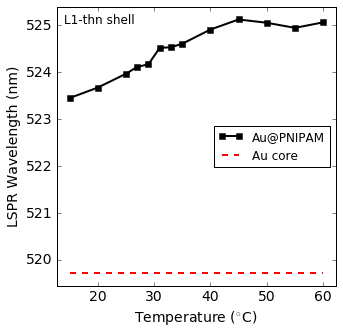

Exported to:
 graphics/20170303_lspr-vs-T_L2-med.svg


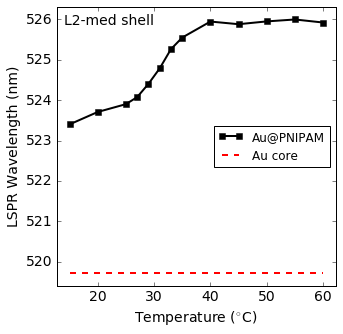

Exported to:
 graphics/20170303_lspr-vs-T_L3-thk.svg


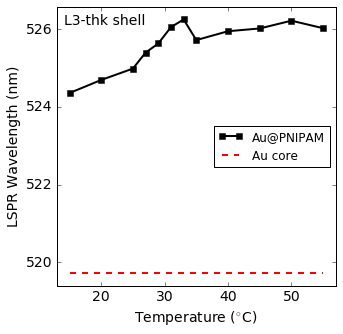

Exported to:
 graphics/20170303_lspr-vs-T_X1-thn.svg


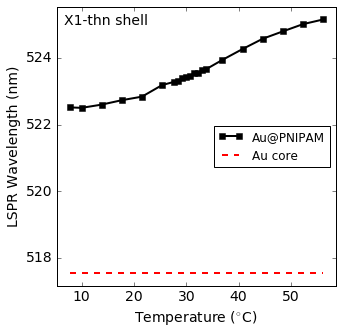

  X2-med shell: No data!
  X3-thk shell: No data!


In [7]:
print('All samples: peak LSPR wavelength vs temperature')
print('================================================')
print('Individually with Au core in red for reference')
def plotAndSave (sampleNum):   
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    sampleLabel = spectrumNames[sampleNum]+' shell'
    
    # data set 1
    label = 'Au@PNIPAM'
    color = 'black'
    marker = 's'
    line = '-'
    selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
    plotArray = lsprPeakWLnmArray[selection]
    x, y = plotArray[:,1], plotArray[:,0]
    if x.size == 0:
        print('  ' + sampleLabel + ': No data!')
        return
    xs, ys, labels, colors, markers, lines = [x], [y], [label], [color], [marker], [line]
    
    # data set 2
    label = 'Au core'
    color = 'red'
    marker = ''
    line = '--'
    if sampleNum < 3: plotArray = lsprPeakWLnmCoreList[0]
    else: plotArray = lsprPeakWLnmCoreList[1]
    x, y = [], []
    for T in xs[0]: x.append(T); y.append(plotArray[0])
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Temperature ($^{\circ}$C)')
    pylab.ylabel("LSPR Wavelength (nm)")
    figText = sampleLabel
    pylab.text(xLimits[0]+0.025*dx, yLimits[1]-0.025*dy, figText, verticalalignment='top', horizontalalignment='left')
    pylab.legend(loc='center right', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-T_" + spectrumNames[sampleNum])
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
for sampleNum in range(6):
    plotAndSave(sampleNum) 


### Together with cores

All samples: peak LSPR wavelength vs temperature
Together with Au cores in black/gray for reference
  X2-med: No data!
  X3-thk: No data!
Exported to:
 graphics/20170303_lspr-vs-T_all.svg


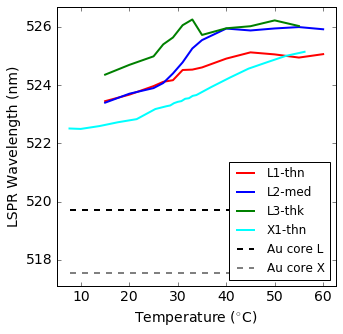

In [8]:
print('All samples: peak LSPR wavelength vs temperature')
print('================================================')
print('Together with Au cores in black/gray for reference')
def plotAndSave ():   
    pylab.cla()
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = spectrumNames[sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = (['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPeakWLnmArray[selection]
        x, y = plotArray[:,1], plotArray[:,0]
        if x.size > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
        else: print('  ' + label + ': No data!')
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = ''
        line = '--'
        plotArray = lsprPeakWLnmCoreList[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(T); y.append(plotArray[0])
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], #marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Temperature ($^{\circ}$C)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='lower right', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-T_all" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores

All samples: peak LSPR wavelength vs temperature
Together with Au cores in black/gray for reference
  X2-med: No data!
  X3-thk: No data!
Exported to:
 graphics/20170303_lspr-vs-T_all-no-cores.svg


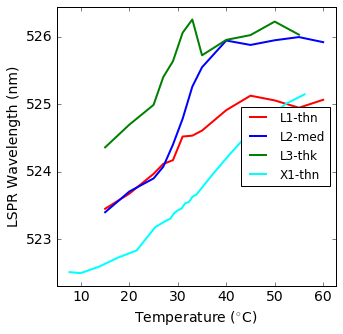

In [9]:
print('All samples: peak LSPR wavelength vs temperature')
print('================================================')
print('Together with Au cores in black/gray for reference')
def plotAndSave ():   
    pylab.cla()
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = spectrumNames[sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = (['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPeakWLnmArray[selection]
        x, y = plotArray[:,1], plotArray[:,0]
        if x.size > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
        else: print('  ' + label + ': No data!')
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = ''
        line = '--'
        plotArray = lsprPeakWLnmCoreList[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(T); y.append(plotArray[0])
        #xs.append(x), ys.append(y), labels.append(label)
        #colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], #marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Temperature ($^{\circ}$C)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='center right', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-T_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

## Peak wavelength vs hydrodynamic radius $R_h$ plots

### Individually with cores

All samples: peak LSPR wavelength vs  hydrodynamic radius
Individually with Au core in red for reference
Exported to:
 graphics/20170303_lspr-vs-Rh_L1-thn.svg


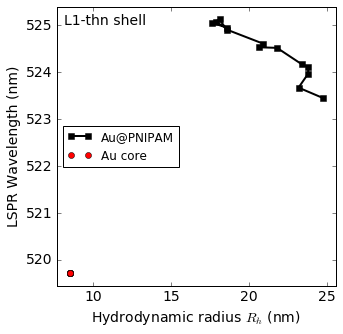

Exported to:
 graphics/20170303_lspr-vs-Rh_L2-med.svg


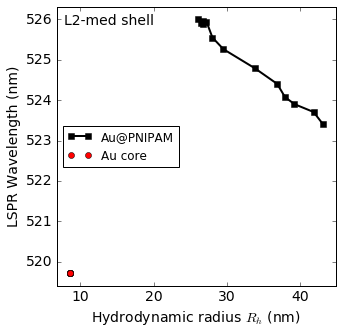

Exported to:
 graphics/20170303_lspr-vs-Rh_L3-thk.svg


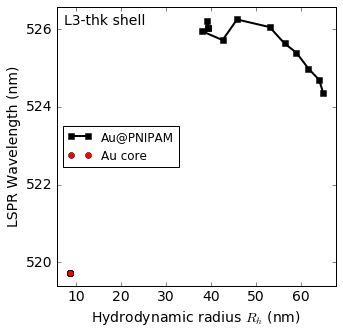

Exported to:
 graphics/20170303_lspr-vs-Rh_X1-thn.svg


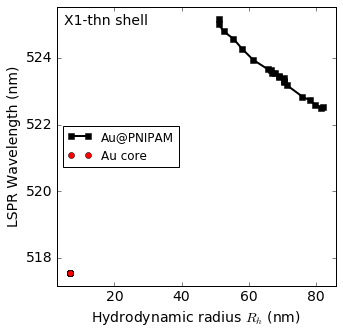

  X2-med shell: No data!
  X3-thk shell: No data!


In [10]:
print('All samples: peak LSPR wavelength vs  hydrodynamic radius')
print('================================================')
print('Individually with Au core in red for reference')
def plotAndSave (sampleNum):   
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    sampleLabel = spectrumNames[sampleNum]+' shell'
    
    # data set 1
    label = 'Au@PNIPAM'
    color = 'black'
    marker = 's'
    line = '-'
    selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
    plotArray = lsprPeakWLnmArray[selection]
    x, y = plotArray[:,2], plotArray[:,0]
    if x.size == 0:
        print('  ' + sampleLabel + ': No data!')
        return
    xs, ys, labels, colors, markers, lines = [x], [y], [label], [color], [marker], [line]
    
    # data set 2
    label = 'Au core'
    color = 'red'
    marker = 'o'
    line = ''
    if sampleNum < 3: 
        plotArray = lsprPeakWLnmCoreList[0]
        Rnm = coreRnms[0]
    else: 
        plotArray = lsprPeakWLnmCoreList[1]
        Rnm = coreRnms[1]
    x, y = [], []
    for T in xs[0]: x.append(Rnm); y.append(plotArray[0])
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    figText = sampleLabel
    pylab.text(xLimits[0]+0.025*dx, yLimits[1]-0.025*dy, figText, verticalalignment='top', horizontalalignment='left')
    pylab.legend(loc='center left', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ( "_lspr-vs-Rh_" + spectrumNames[sampleNum] )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
for sampleNum in range(6):
    plotAndSave(sampleNum) 


### Together with cores

All samples: peak LSPR wavelength vs hydrodynamic radius
Together with Au cores in black/gray for reference
  X2-med: No data!
  X3-thk: No data!
Exported to:
 graphics/20170303_lspr-vs-Rh_all.svg


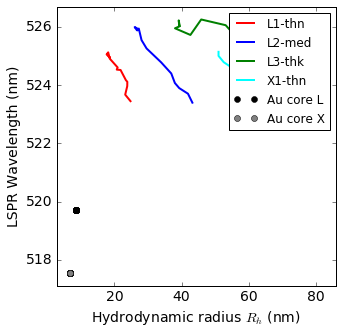

In [11]:
print('All samples: peak LSPR wavelength vs hydrodynamic radius')
print('================================================')
print('Together with Au cores in black/gray for reference')
def plotAndSave ():   
    pylab.cla()
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = spectrumNames[sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = ''#(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPeakWLnmArray[selection]
        x, y = plotArray[:,2], plotArray[:,0]
        if x.size > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
        else: print('  ' + label + ': No data!')
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = 'o'
        line = ''
        plotArray = lsprPeakWLnmCoreList[coreNum]
        Rnm = coreRnms[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(Rnm); y.append(plotArray[0])
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper right', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-Rh_all" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores

All samples: peak LSPR wavelength vs hydrodynamic radius
Together without Au cores in black/gray for reference
  X2-med: No data!
  X3-thk: No data!
Exported to:
 graphics/20170303_lspr-vs-Rh_all-no-cores.svg


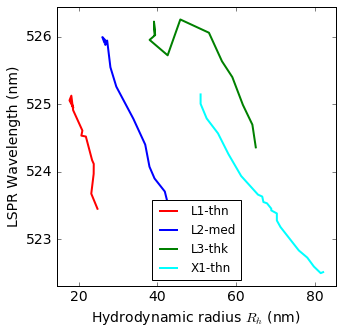

In [12]:
print('All samples: peak LSPR wavelength vs hydrodynamic radius')
print('================================================')
print('Together without Au cores in black/gray for reference')
def plotAndSave ():   
    pylab.cla()
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = spectrumNames[sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = ''#(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPeakWLnmArray[selection]
        x, y = plotArray[:,2], plotArray[:,0]
        if x.size > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
        else: print('  ' + label + ': No data!')
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = 'o'
        line = ''
        plotArray = lsprPeakWLnmCoreList[coreNum]
        Rnm = coreRnms[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(Rnm); y.append(plotArray[0])
        #xs.append(x), ys.append(y), labels.append(label)
        #colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='lower center', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-Rh_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

## Hydrodynamic radius vs peak wavelength plots

### Together with cores

  X2-med: No data!
  X3-thk: No data!
Exported to:
 graphics/20170303_Rh-vs-lspr_all.svg


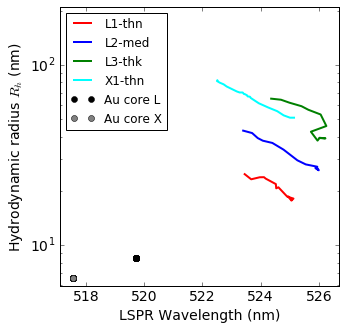

In [14]:
def plotAndSave ():   
    pylab.cla()
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = spectrumNames[sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = ''#(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPeakWLnmArray[selection]
        x, y = plotArray[:,2], plotArray[:,0]
        if x.size > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
        else: print('  ' + label + ': No data!')
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = 'o'
        line = ''
        plotArray = lsprPeakWLnmCoreList[coreNum]
        Rnm = coreRnms[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(Rnm); y.append(plotArray[0])
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.semilogy(ys[setNum], xs[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(ys[setNum][i]); y.append(xs[setNum][i])
    y.append(np.min(spectraRhnms[0]))
    y.append(np.max(spectraRhnms[-1]))
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [0.9*np.amin(y), 1.1*np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.ylabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.xlabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    #pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(axis='x', nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_Rh-vs-lspr_all" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores

  X2-med: No data!
  X3-thk: No data!
Exported to:
 graphics/20170303_lspr-vs-Rh_all-no-cores.svg


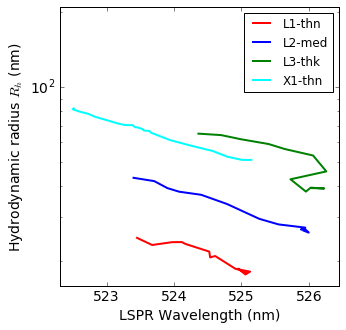

In [15]:
def plotAndSave ():   
    pylab.cla()
    spectrumNames = ['L1-thn','L2-med','L3-thk','X1-thn','X2-med','X3-thk']
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = spectrumNames[sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = ''#(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPeakWLnmArray[selection]
        x, y = plotArray[:,2], plotArray[:,0]
        if x.size > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
        else: print('  ' + label + ': No data!')
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = 'o'
        line = ''
        plotArray = lsprPeakWLnmCoreList[coreNum]
        Rnm = coreRnms[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(Rnm); y.append(plotArray[0])
        #xs.append(x), ys.append(y), labels.append(label)
        #colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.semilogy(ys[setNum], xs[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(ys[setNum][i]); y.append(xs[setNum][i])
    y.append(np.min(spectraRhnms[0]))
    y.append(np.max(spectraRhnms[-1]))
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [0.9*np.amin(y), 1.1*np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.ylabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.xlabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper right', fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    # pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(axis='x', nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-Rh_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

# Peak Analysis: Power law baseline for scattering correction

## Peak analysis

### Core only

In [17]:
threshold = 0.25
wlExpectednm = 525
dwlExpectednm = 25
x0base = wlExpectednm
nPeaks = 1
wlMin0nm, wlMax0nm = 400, 800
wlMinnm, wlMaxnm = wlExpectednm-dwlExpectednm, wlExpectednm+dwlExpectednm

timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
exportFormat = '.dat'
identifier = "_lspr-core-peaks_baseline-powr"
folder = 'graphics/'
datHeader = ('\t').join(('wl-nm', 'wl-orig-nm', 'Rcore-nm'))

print('LSPR peak wavelengths')
print('=====================')
print('Bare cores only')
print('  * power law baseline fit')
print('    - of the form ybase = k*(x/x0)^n')
print('    - using log-log/linear fitting with x0 =',x0base)
print('  * looking for one peak at', wlExpectednm, 
      'nm \n    - in the range [', wlMinnm, ',', wlMaxnm, '] nm')
print('    - baseline correction range [', wlMin0nm, ',', wlMax0nm, '] nm')
print('Peaks detected: \n    wl-nm (interp),\t [wl-nm, ext], \t (orig wl-nm)')

lsprPowrPeakWLnmCoreList = []
lsprPowrBaselineCoreList = []
lsprPowrBaselineCorenkList = []
for sampleNum in range(2):
    sampleType = (['L-Core_D=','X-Core_D='][sampleNum]) + str(int(round(2*coreRnms[sampleNum]))) + '-nm'
    print('  * Core #',sampleNum,'(', sampleType, ')', end="")
    
    subdataArray = spectraCores[sampleNum]
    selection = ((subdataArray[:,0] >= wlMin0nm) 
                 & (subdataArray[:,0] <= wlMax0nm)
                 )
    subdataArray = subdataArray[selection]
    minDist = int(subdataArray.size/(nPeaks+1))
    
    x, y = subdataArray[:,0], subdataArray[:,1]
    yOrig = y
    logx, logy = np.log(x/x0base), np.log(y)
    dlogx = min(np.diff(logx))
    loglogx = np.arange(min(logx), max(logx) + dlogx, dlogx)
    loglogy = np.interp(loglogx, logx, logy)
    
    loglogyLinBase = peakutils.baseline(loglogy, 1)
    logyLinBase = np.interp(logx, loglogx, loglogyLinBase)
    loglogfit = np.polyfit(logx, logyLinBase, 1)
    basePowrn, baseCoeffk = loglogfit[0], np.exp(loglogfit[1])
    print('\t{baseline n =', '{0:.2f}'.format(basePowrn),', k =', '{0:.1f}'.format(baseCoeffk),'}')
    
    yPowrBase = (np.exp(logyLinBase))
    y = y - yPowrBase
    
    indexes = peakutils.indexes(y, thres=threshold, min_dist=minDist)
    xPeaks = x[indexes]
    anArray = (np.array([xPeaks, indexes])).T
    selection = (anArray[:,0] > wlMinnm) & (anArray[:,0] < wlMaxnm)
    indexes = (anArray[selection][:,1]).tolist()
    xPeaks = x[indexes]
    if (len(indexes) > 0): 
        result = subdataArray[indexes[0]]
        xPeaks = peakutils.interpolate(x, y, indexes)
        print('   ', round(100*xPeaks[0])/100,',\t\t',  
              (np.round(100*result)/100).tolist(),
              '\t (', round(100*lsprPeakWLnmCoreList[sampleNum][0])/100,')')
        result = [xPeaks[0], lsprPeakWLnmCoreList[sampleNum][0], coreRnms[sampleNum]]
        lsprPowrPeakWLnmCoreList.append(result)
        lsprPowrBaselineCoreList.append([x, yOrig, y[indexes][0], y, yPowrBase])
        lsprPowrBaselineCorenkList.append([x0base, basePowrn, baseCoeffk])

filename = folder + timestamp + identifier + exportFormat
np.savetxt(filename, lsprPowrPeakWLnmCoreList, delimiter='\t', header=datHeader, fmt='%.2f')
print('     + saved to', filename) 
print('variable: \t lsprPowrPeakWLnmCoreList')
print("  * output array format: \n    [ peak-wl-nm, orig-peak-wl-nm, Rcore-nm ]")
print('variable: \t lsprPowrBaselineCoreList')
print("  * output array format: \n    [ wl-nm-data, ext-data, peak-corr-ext",
      "ext-corrected-data, baseline-correction-data]")
print('  * wavelength range: [',lsprPowrBaselineCoreList[0][0][0],',', 
      lsprPowrBaselineCoreList[0][0][-1],'] x (',len(lsprPowrBaselineCoreList[0][0]), 'values)')
print('variable: \t lsprPowrBaselineCorenkList')
print("  * output array format: \n    [ x0, n, k ]")


LSPR peak wavelengths
Bare cores only
  * power law baseline fit
    - of the form ybase = k*(x/x0)^n
    - using log-log/linear fitting with x0 = 525
  * looking for one peak at 525 nm 
    - in the range [ 500 , 550 ] nm
    - baseline correction range [ 400 , 800 ] nm
Peaks detected: 
    wl-nm (interp),	 [wl-nm, ext], 	 (orig wl-nm)
  * Core # 0 ( L-Core_D=17-nm )	{baseline n = -4.74 , k = 0.2 }
    521.21 ,		 [522.0, 1.1] 	 ( 519.72 )
  * Core # 1 ( X-Core_D=13-nm )	{baseline n = -4.40 , k = 0.3 }
    519.74 ,		 [519.0, 1.44] 	 ( 517.55 )
     + saved to graphics/20170303_lspr-core-peaks_baseline-powr.dat
variable: 	 lsprPowrPeakWLnmCoreList
  * output array format: 
    [ peak-wl-nm, orig-peak-wl-nm, Rcore-nm ]
variable: 	 lsprPowrBaselineCoreList
  * output array format: 
    [ wl-nm-data, ext-data, peak-corr-ext ext-corrected-data, baseline-correction-data]
  * wavelength range: [ 400.0 , 800.0 ] x ( 401 values)
variable: 	 lsprPowrBaselineCorenkList
  * output array format: 
 

### Baseline correction plots: core only

Core only spectra: baseline correction
Individually. Not used to assess LSPR wavelength, but to correct core-shell spectra


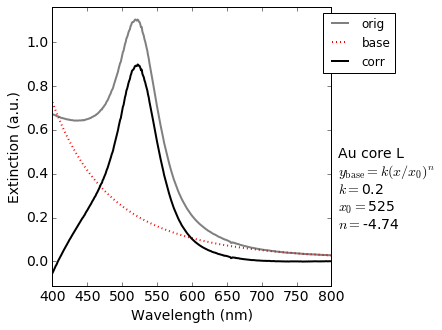

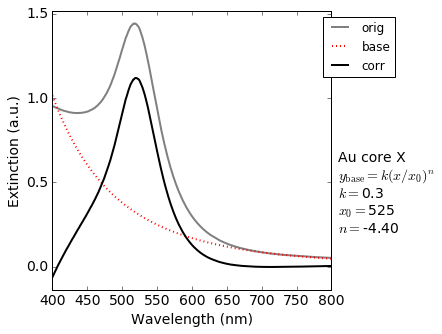

In [18]:
print('Core only spectra: baseline correction')
print('======================================')
print('Individually. Not used to assess LSPR wavelength,', 
      'but to correct core-shell spectra')
def plotAndSave (sampleNum):   
    sampleLabel = 'Au core '+['L','X'][sampleNum]
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []

    # data set 1
    label = 'orig'
    color = 'gray'
    marker = ''
    line = '-'
    plotArray = lsprPowrBaselineCoreList[sampleNum]
    x, y = plotArray[0], plotArray[1]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 2
    label = 'base'
    color = 'red'
    marker = ''
    line = ':'
    plotArray = lsprPowrBaselineCoreList[sampleNum]
    x, y = plotArray[0], plotArray[-1]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 3
    label = 'corr'
    color = 'black'
    marker = ''
    line = '-'
    plotArray = lsprPowrBaselineCoreList[sampleNum]
    x, y = plotArray[0], plotArray[-2]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.0*dx, np.amax(x)+ 0.0*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Wavelength (nm)')
    pylab.ylabel('Extinction (a.u.)')
    fitx0 = lsprPowrBaselineCorenkList[sampleNum][0]
    fitn = lsprPowrBaselineCorenkList[sampleNum][1]
    fitk = lsprPowrBaselineCorenkList[sampleNum][2]
    figText = (sampleLabel + '\n$y_{\mathrm{base}} = k(x/x_0)^n$'
               + '\n$k=${0:.1f}\n$x_0=${1}\n$n=${2:.2f}'.format(fitk,fitx0,fitn))
    pylab.text(xLimits[1]+0.025*dx, yLimits[0]+0.5*dy, figText, 
               verticalalignment='top', horizontalalignment='left')
    pylab.legend(loc='upper right', bbox_to_anchor=(1.25,1.), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=8)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_spectrum-core-baseline-powr_" + sampleLabel)
    filename = "graphics/" + timestamp + identifier + exportFormat
    #pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
for sampleNum in range(2):
    plotAndSave(sampleNum) 


### Core-shell

In [19]:
threshold = 0.25
wlExpectednm = 525
dwlExpectednm = 25
x0base = wlExpectednm
nPeaks = 1
wlMin0nm, wlMax0nm = 400, 800
wlMinnm, wlMaxnm = wlExpectednm-dwlExpectednm, wlExpectednm+dwlExpectednm

timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
exportFormat = '.dat'
identifier0 = "lspr-peaks_baseline-powr"
folder = 'graphics/'
datHeader = ('\t').join(('wl-nm', 'orig-wl-nm', 'temp-C', 'Rh-nm'))

print('LSPR peak wavelengths')
print('=====================')
print('Core-shell nanoparticles')
print('  * power law baseline fit')
print('    - of the form ybase = k*(x/x0)^n')
print('    - using log-log/linear fitting with x0 =',x0base)
print('  * looking for one peak at', wlExpectednm, 
      'nm \n    - in the range [', wlMinnm, ',', wlMaxnm, '] nm')
print('    - baseline correction range [', wlMin0nm, ',', wlMax0nm, '] nm')
print('Peaks detected: \n    wl-nm,\t [wl-nm, ext, T-C, Rh-nm], \t (orig wl-nm)',
     '\t (n0, k0)', '\t scal.',  '\t (n, k)')

lsprPowrPeakWLnmList = []
lsprPowrBaselineList = []
lsprPowrBaselinenkList = []
lsprPowrBaselineExpvsScaPrmList = []
x = []
for sampleNum in range(6):
    sampleType = (['L-Thn','L-Med','L-Thk','X-Thn','X-Med','X-Thk'][sampleNum])
    print(' * Sample #',sampleNum,'(', sampleType, ')')
    lsprPeakWLnmSubList = []
    indexT = 0
    coreNum = 0
    if sampleNum >= 3: coreNum = 1
    
    for T in spectraTemps[sampleNum]:
        selection = ((dataArray[:,-1] == sampleNum) 
                     & (dataArray[:,-3] == T)
                     & (dataArray[:,0] >= wlMin0nm) 
                     & (dataArray[:,0] <= wlMax0nm)
                     )
        subdataArray = dataArray[selection]
        minDist = int(subdataArray.size/(nPeaks+1))
        
        x, y = subdataArray[:,0], subdataArray[:,1]
        yOrig = y
        logx, logy = np.log(x/x0base), np.log(y)
        dlogx = min(np.diff(logx))
        loglogx = np.arange(min(logx), max(logx) + dlogx, dlogx)
        loglogy = np.interp(loglogx, logx, logy - min(logy))

        loglogyLinBase = peakutils.baseline(loglogy, 1)
        logyLinBase = np.interp(logx, loglogx, loglogyLinBase) + min(logy)
        loglogfit = np.polyfit(logx, logyLinBase, 1)
        basePowrn0, baseCoeffk0 = loglogfit[0], np.exp(loglogfit[1])
    
        yPowrBase = (np.exp(logyLinBase))
        y = y - yPowrBase
        indexes = peakutils.indexes(y, thres=threshold, min_dist=minDist)
        xPeaks = x[indexes]
        anArray = (np.array([xPeaks, indexes])).T
        selection = (anArray[:,0] > wlMinnm) & (anArray[:,0] < wlMaxnm)
        indexes = (anArray[selection][:,1]).tolist()
        # if no peaks:
        if (len(indexes) == 0): 
            selection = (x >= wlMinnm) & (x <= wlMaxnm)
            xzoom, yzoom = x[selection], y[selection]
            indexeszoom = peakutils.indexes(yzoom, thres=threshold, min_dist=minDist)
            indexes = indexeszoom + (wlMinnm - wlMin0nm)
        xPeaks = x[indexes]
                
        selection = ( (lsprPowrBaselineCoreList[coreNum][0] >= wlMin0nm)
                     & (lsprPowrBaselineCoreList[coreNum][0] <= wlMax0nm)
                     )
        yCorePowrBase = np.asarray(lsprPowrBaselineCoreList[coreNum][-1])[selection]
        yCorePeak = lsprPowrBaselineCoreList[coreNum][2]
        scaling = 1*y[indexes][0]/yCorePeak
        y = y + yCorePowrBase*scaling
        
        # fit [(base) - (core base)] to power law
        yPowrBaseTotal = yPowrBase - yCorePowrBase*scaling
        logy = np.log(yPowrBaseTotal)
        if min(yPowrBaseTotal) > 0: 
            logy = np.log(yPowrBaseTotal)
            loglogfit = np.polyfit(logx, logy, 1)
        else: loglogfit = [0, 0]
        basePowrn, baseCoeffk = loglogfit[0], np.exp(loglogfit[1])
        
        indexes = peakutils.indexes(y, thres=threshold, min_dist=minDist)
        xPeaks = x[indexes]
        anArray = (np.array([xPeaks, indexes])).T
        selection = (anArray[:,0] > wlMinnm) & (anArray[:,0] < wlMaxnm)
        indexes = (anArray[selection][:,1]).tolist()
        # if no peaks:
        if (len(indexes) == 0): 
            selection = (x >= wlMinnm) & (x <= wlMaxnm)
            xzoom, yzoom = x[selection], y[selection]
            indexeszoom = peakutils.indexes(yzoom, thres=threshold, min_dist=minDist)
            indexes = indexeszoom + (wlMinnm - wlMin0nm)
        xPeaks = x[indexes]

        # iterate 
        for i in range(20):
            oldScaling = scaling
            scaling = 1*(y[indexes[0]] - yCorePowrBase[indexes[0]]*scaling)/yCorePeak
            if ( abs(1-oldScaling/scaling) < 0.000001 ): break
            
            y = yOrig - yPowrBase + yCorePowrBase*scaling
            indexes = peakutils.indexes(y, thres=threshold, min_dist=minDist)
            xPeaks = x[indexes]
            anArray = (np.array([xPeaks, indexes])).T
            selection = (anArray[:,0] > wlMinnm) & (anArray[:,0] < wlMaxnm)
            indexes = (anArray[selection][:,1]).tolist()
            # if no peaks:
            if (len(indexes) == 0): 
                selection = (x >= wlMinnm) & (x <= wlMaxnm)
                xzoom, yzoom = x[selection], y[selection]
                indexeszoom = peakutils.indexes(yzoom, thres=threshold, min_dist=minDist)
                indexes = indexeszoom + (wlMinnm - wlMin0nm)

        if (len(indexes) > 0): 
            result = subdataArray[indexes[0]]
            Rhnm = result[-2]
            xPeaks = peakutils.interpolate(x, y, indexes)
            selection = (lsprPeakWLnmArray[:,-1] == sampleNum) & (lsprPeakWLnmArray[:,-3] == T)
            xPeaksOrig = lsprPeakWLnmArray[selection]
            if len(xPeaksOrig) > 0: xPeaksOrig = xPeaksOrig[0, 0]
            else: xPeaksOrig = 0
            indexT = indexT + 1
            print('   ', round(100*xPeaks[0])/100,',\t',  
                  (np.round(100*result[0:-1])/100).tolist(),
                  '\t (',round(100*xPeaksOrig)/100,')',
                  '\t ({0:.2f}, {1:.3f})\t {2:.3f}'.format(basePowrn0, baseCoeffk0, scaling),
                  '\t ({0:.2f}, {1:.3f}) '.format(basePowrn, baseCoeffk))
            result = [xPeaks[0], xPeaksOrig, result[-3], result[-2], int(result[-1])]
            lsprPowrPeakWLnmList.append(result)
            lsprPowrBaselineList.append([x, yOrig, scaling, y, yPowrBase, 
                                         yPowrBase-yCorePowrBase*scaling])
            lsprPowrBaselinenkList.append([x0base, basePowrn0, baseCoeffk0])
            result = [xPeaks[0], xPeaksOrig, result[-3], result[-2]]
            lsprPeakWLnmSubList.append(result)
            
            scatParam = 2*pi*Rhnm/(xPeaks[0]/1.35)
            lsprPowrBaselineExpvsScaPrmList.append([scatParam, basePowrn])
            
    if len(lsprPeakWLnmSubList) == 0: lsprPeakWLnmSubList.append( [0,0,0] )
    lsprPeakWLnmSubList = np.asarray(lsprPeakWLnmSubList)
    identifier = '_' + identifier0 + '_' + str(sampleNum) + '-' + sampleType
    filename = folder + timestamp + identifier + exportFormat
    np.savetxt(filename, lsprPeakWLnmSubList, delimiter='\t', header=datHeader, fmt='%.2f')
    print('      + saved to', filename) 

lsprPowrPeakWLnmArray = np.asarray(lsprPowrPeakWLnmList)
print('variable: \t lsprPolyPeakWLnmArray')
print("  * output array format: \n    [ peak-wl-nm, orig-peak-wl-nm, temp-C, Rh-nm, sample-# ]")
print("    - sample-# = [0,...,5] \n      for [lin-Thin, lin-Med., lin-Long, X-Thin, X-Med., X-Long]")
print('variable: \t lsprPolyBaselineList')
print("  * output array format: \n",
      "   [ wl-nm-data, ext-orig-data, ext-scaling-factor, ext-corrected-data,",
      "baseline-correction-no-core-data, baseline-correction-data]")
print('  * wavelength range: [',x[0],',',x[-1],'] x (',len(x), 'values)')
print('variable: \t lsprPowrBaselinenkList')
print("  * output array format: \n    [ x0, n0, k0 ]")
print('variable: \t lsprPowrBaselineExpvsScaPrmList')
print("  * output array format: \n    [ ScatParam, n-exponent ]")


LSPR peak wavelengths
Core-shell nanoparticles
  * power law baseline fit
    - of the form ybase = k*(x/x0)^n
    - using log-log/linear fitting with x0 = 525
  * looking for one peak at 525 nm 
    - in the range [ 500 , 550 ] nm
    - baseline correction range [ 400 , 800 ] nm
Peaks detected: 
    wl-nm,	 [wl-nm, ext, T-C, Rh-nm], 	 (orig wl-nm) 	 (n0, k0) 	 scal. 	 (n, k)
 * Sample # 0 ( L-Thn )
    523.33 ,	 [522.0, 0.69, 15.0, 24.77] 	 ( 523.45 ) 	 (-4.79, 0.120)	 0.629 	 (0.00, 1.000) 
    523.62 ,	 [524.0, 0.69, 20.0, 23.19] 	 ( 523.68 ) 	 (-4.69, 0.123)	 0.629 	 (0.00, 1.000) 
    523.91 ,	 [526.0, 0.69, 25.0, 23.8] 	 ( 523.97 ) 	 (-4.68, 0.125)	 0.635 	 (0.00, 1.000) 
    524.18 ,	 [523.0, 0.7, 27.0, 23.82] 	 ( 524.12 ) 	 (-4.63, 0.126)	 0.630 	 (0.00, 1.000) 
    524.1 ,	 [524.0, 0.7, 29.0, 23.4] 	 ( 524.17 ) 	 (-4.80, 0.121)	 0.638 	 (0.00, 1.000) 
    524.46 ,	 [524.0, 0.7, 31.0, 21.81] 	 ( 524.52 ) 	 (-4.63, 0.126)	 0.637 	 (0.00, 1.000) 
    524.47 ,	 [525.0, 0.7, 33.0, 

header_import_data.py:86: RuntimeWarning: invalid value encountered in log
  folderName = 'data_20160906'


    525.22 ,	 [526.0, 0.65, 36.91, 61.3] 	 ( 523.94 ) 	 (-4.03, 0.206)	 0.396 	 (-3.54, 0.084) 
    525.61 ,	 [526.0, 0.66, 40.76, 58.07] 	 ( 524.26 ) 	 (-4.05, 0.211)	 0.399 	 (-3.58, 0.088) 
    525.98 ,	 [526.0, 0.66, 44.61, 55.41] 	 ( 524.57 ) 	 (-4.06, 0.215)	 0.401 	 (-3.63, 0.091) 
    526.31 ,	 [526.0, 0.67, 48.46, 52.53] 	 ( 524.79 ) 	 (-3.94, 0.228)	 0.399 	 (-3.43, 0.104) 
    526.55 ,	 [526.0, 0.67, 52.31, 50.99] 	 ( 525.01 ) 	 (-3.94, 0.228)	 0.400 	 (-3.44, 0.104) 
    526.72 ,	 [526.0, 0.68, 56.16, 50.99] 	 ( 525.15 ) 	 (-3.94, 0.230)	 0.400 	 (-3.44, 0.106) 
      + saved to graphics/20170303_lspr-peaks_baseline-powr_3-X-Thn.dat
 * Sample # 4 ( X-Med )
    525.43 ,	 [526.0, 0.26, 7.65, 144.22] 	 ( 0.0 ) 	 (-2.83, 0.189)	 0.065 	 (-2.67, 0.168) 
    525.46 ,	 [526.0, 0.26, 9.96, 143.8] 	 ( 0.0 ) 	 (-2.82, 0.193)	 0.065 	 (-2.66, 0.172) 
    525.51 ,	 [526.0, 0.26, 13.81, 142.45] 	 ( 0.0 ) 	 (-2.82, 0.192)	 0.065 	 (-2.66, 0.171) 
    525.63 ,	 [526.0, 0.27, 17.66, 137.13

### Baseline correction plots: core-shell only

Core-shell only spectra: baseline correction
Individually. 
  * "orig/Shl" = original core-shell NP spectrum
  * "base/Shl" = partial baseline correction (without core subtraction)
  * "base/Tot" = total baseline correction (with core substraction)
  * "corr/Shl" = corrected core-shell NP spectrum
  * "scld/Cor" = core-only NP spectrum scaled to match core-shell ext. peak


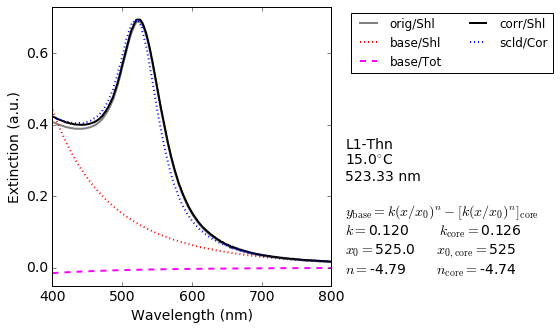

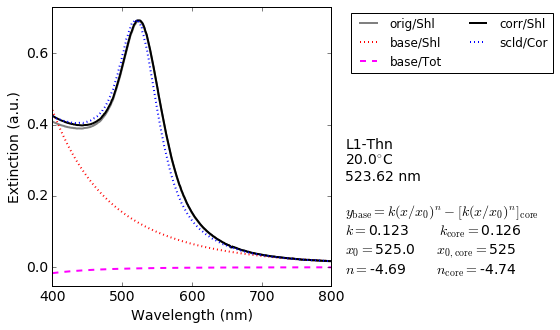

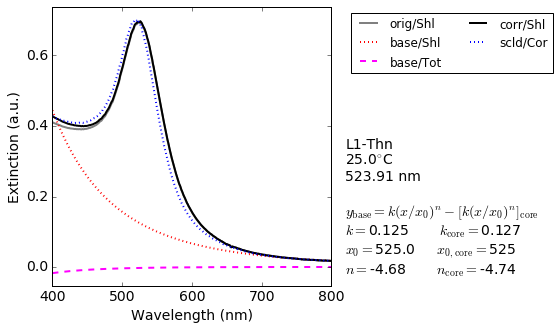

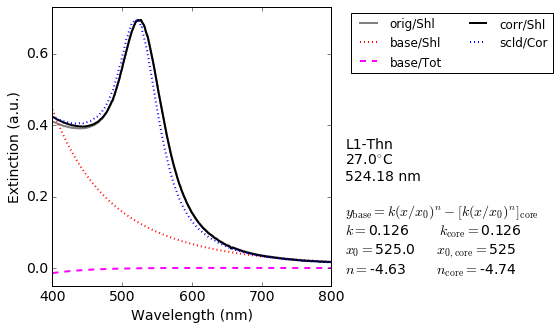

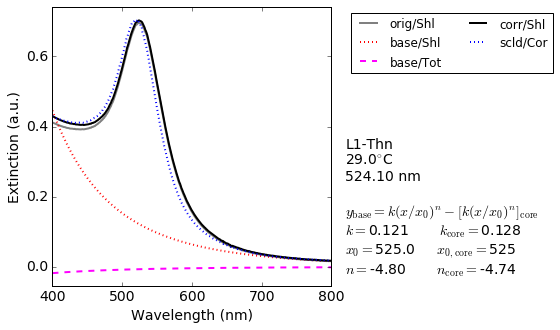

...

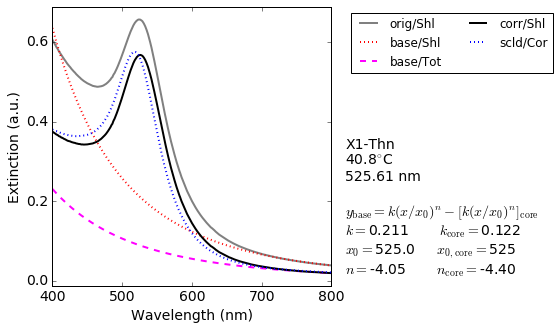

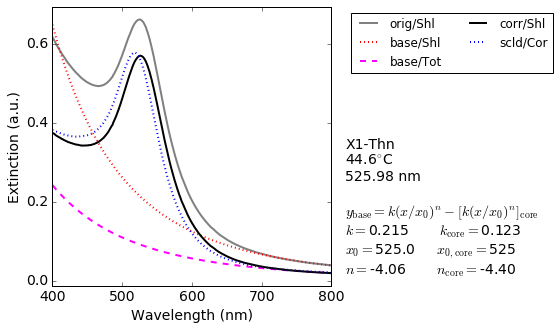

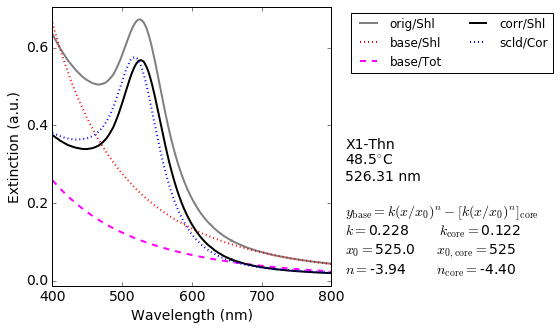

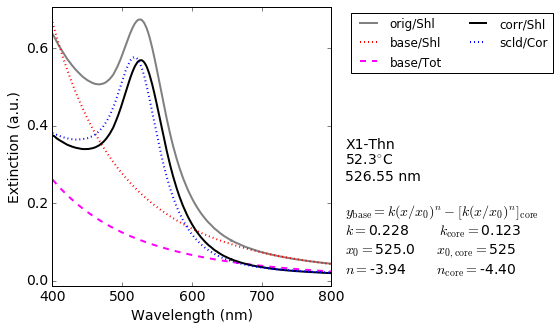

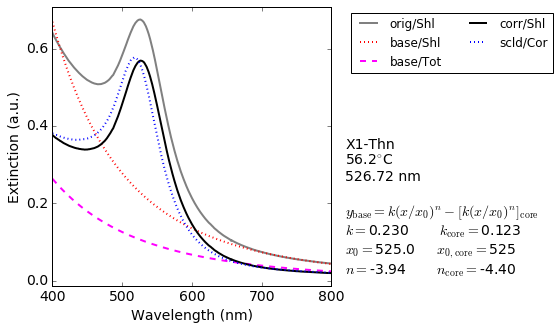

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-7.6.svg


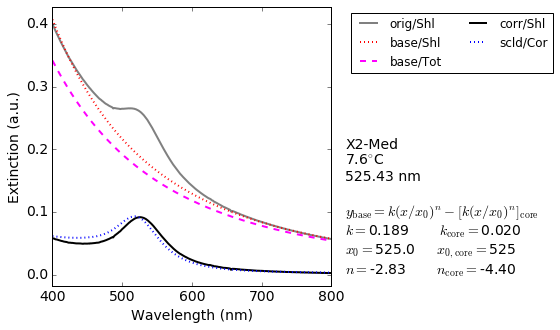

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-10.0.svg


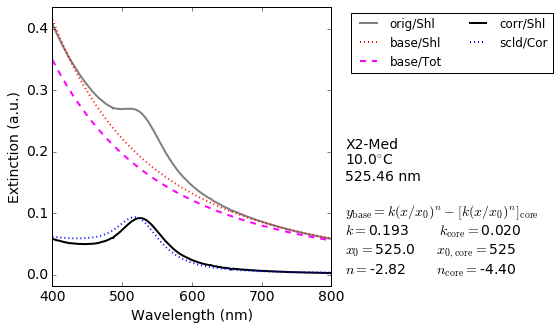

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-13.8.svg


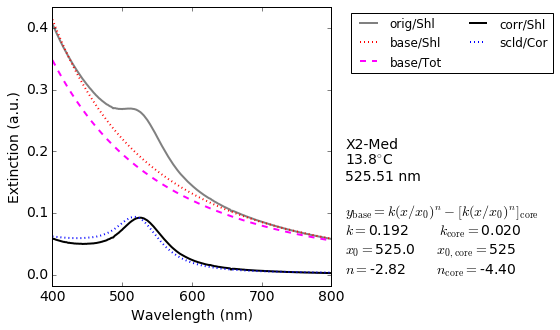

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-17.7.svg


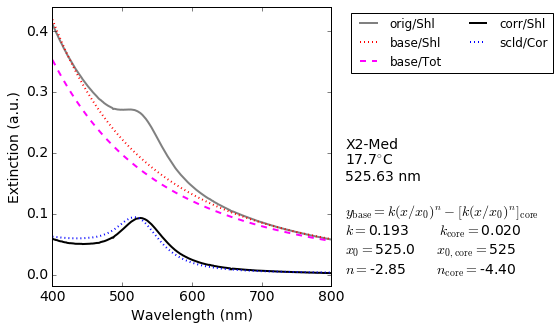

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-21.5.svg


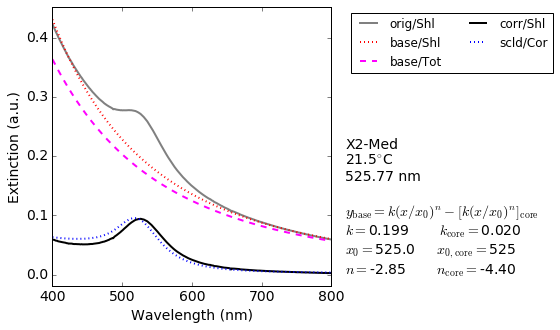

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-25.4.svg


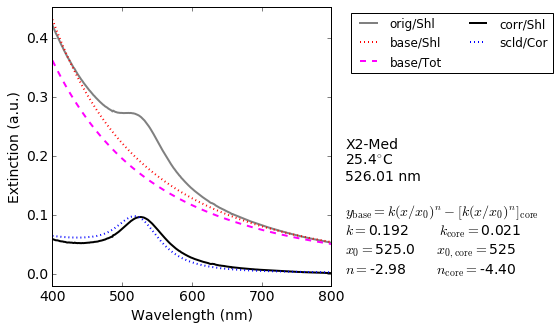

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-27.7.svg


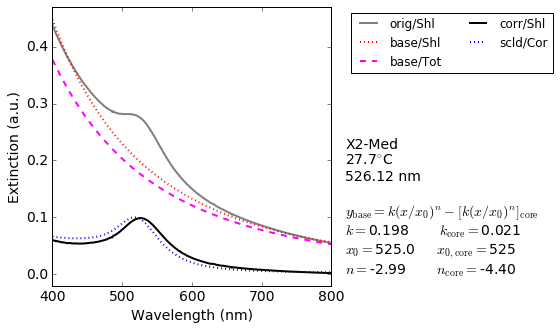

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-28.4.svg


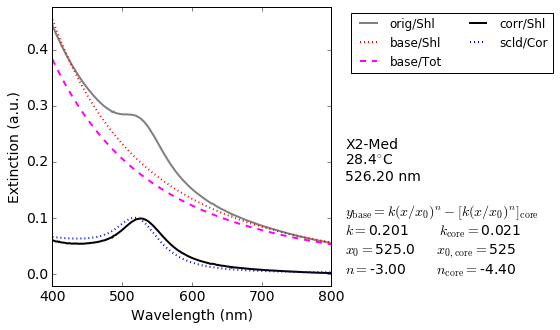

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-29.2.svg


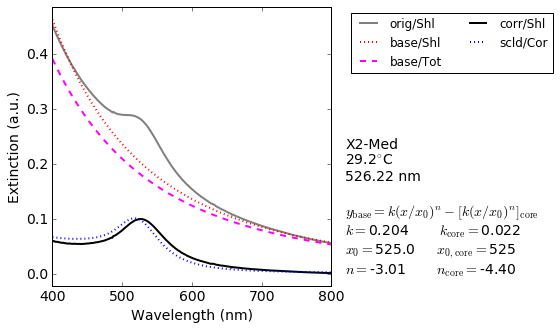

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-30.0.svg


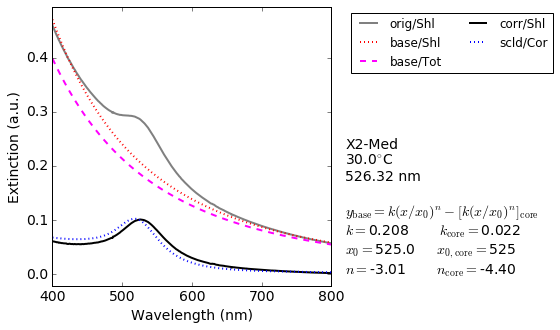

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-30.8.svg


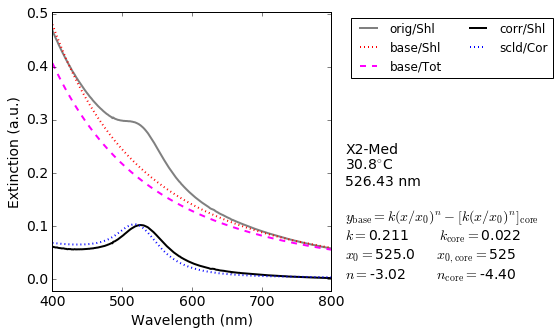

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-31.5.svg


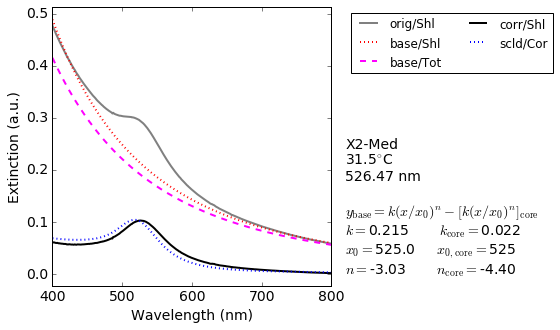

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-32.3.svg


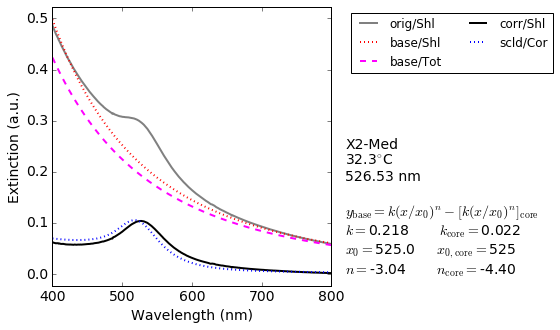

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-33.1.svg


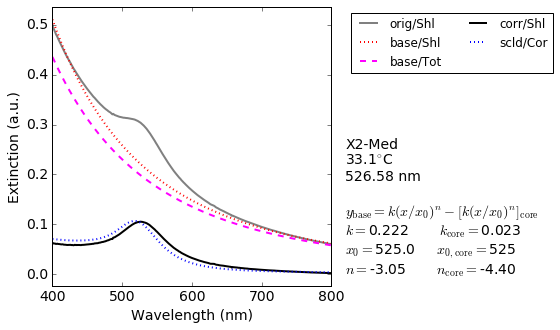

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-33.8.svg


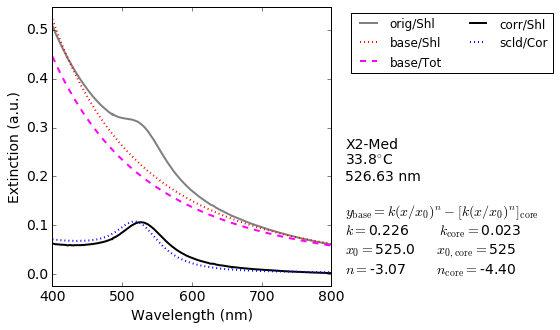

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-36.9.svg


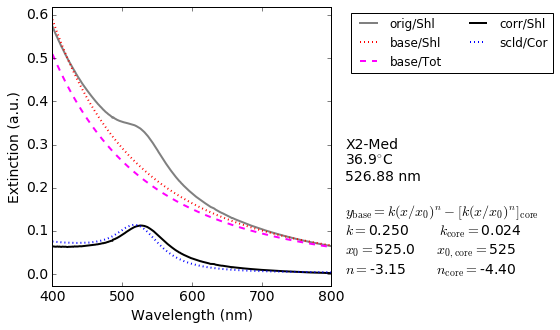

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-40.8.svg


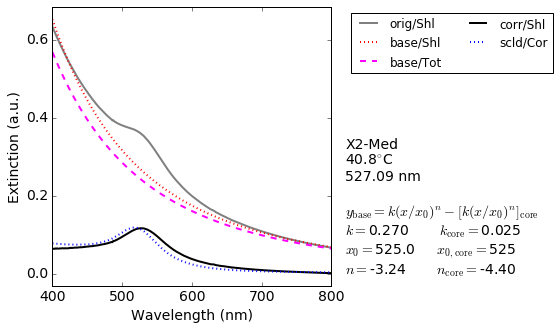

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-44.6.svg


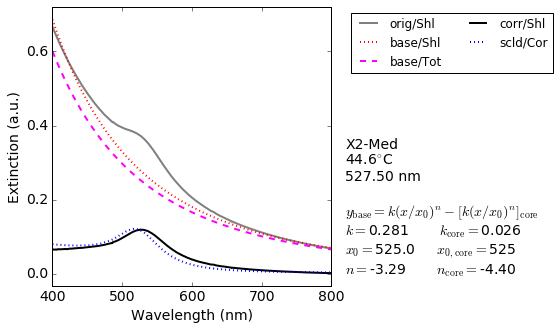

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-48.5.svg


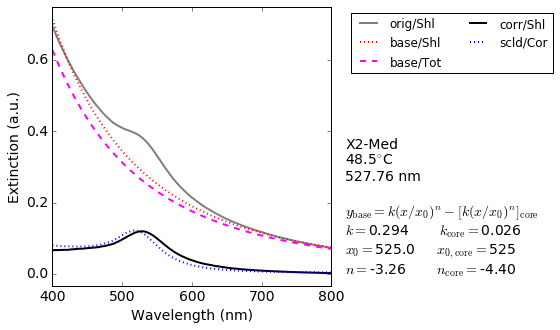

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-52.3.svg


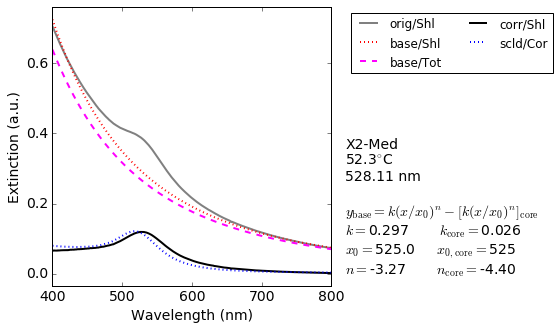

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_X2-Med-56.2.svg


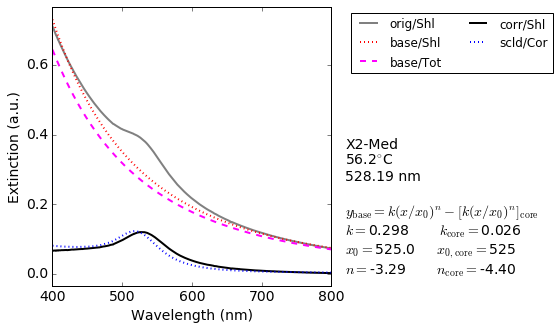

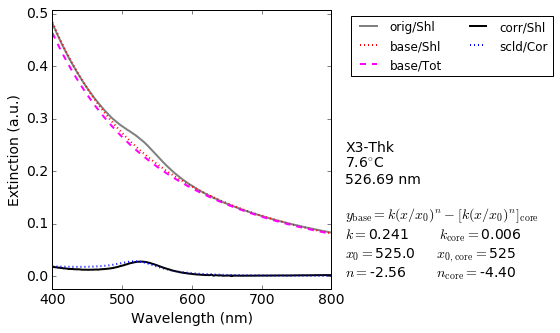

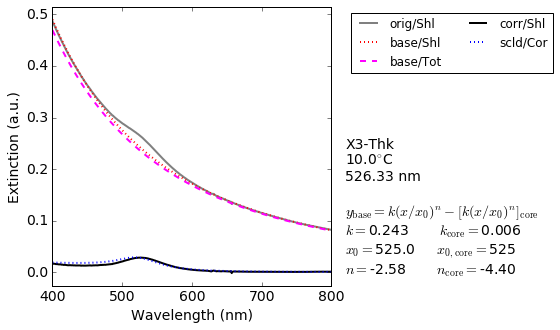

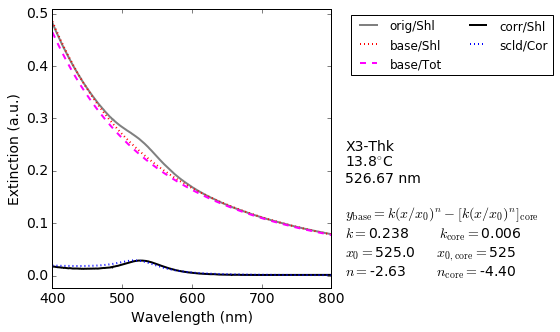

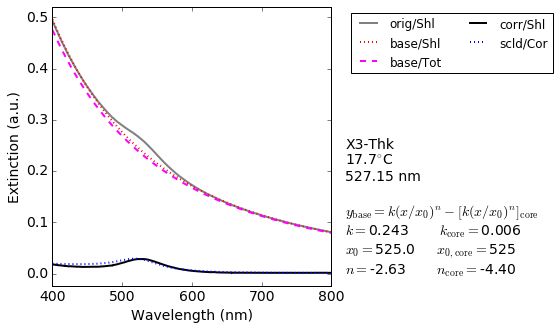

...

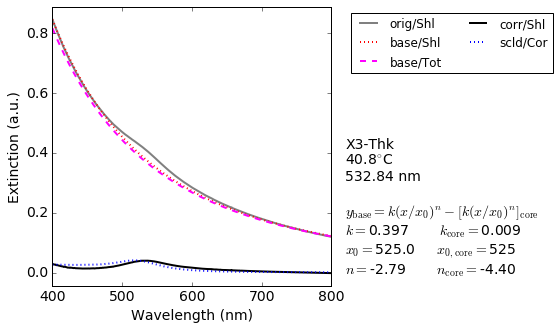

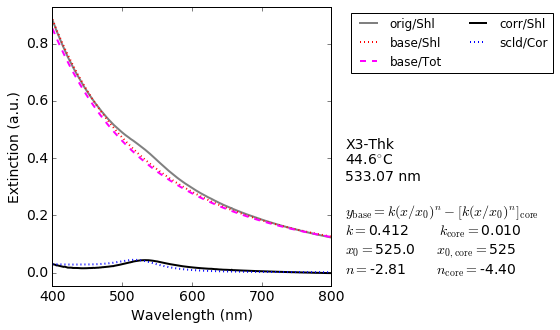

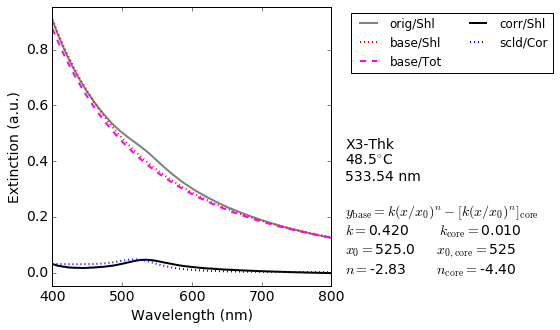

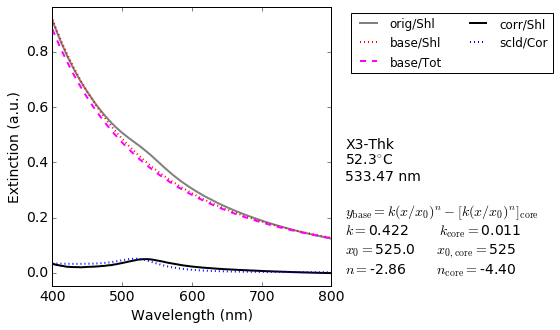

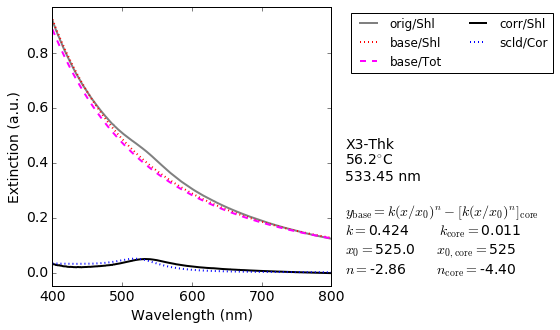

In [20]:
print('Core-shell only spectra: baseline correction')
print('======================================')
print('Individually. ')
print('  * \"orig/Shl\" = original core-shell NP spectrum')
print('  * \"base/Shl\" = partial baseline correction (without core subtraction)')
print('  * \"base/Tot\" = total baseline correction (with core substraction)')
print('  * \"corr/Shl\" = corrected core-shell NP spectrum')
print('  * \"scld/Cor\" = core-only NP spectrum scaled to match core-shell ext. peak')

def plotAndSave (sampleNum, tempC):   
    sampleLabel = ['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]
    tempLabel = str(round(10*tempC)/10)
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    coreNum = 0
    if (sampleNum >= 3): coreNum = 1
    
    selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum) & (lsprPowrPeakWLnmArray[:,-3] == tempC)
    plotArray = np.asarray(lsprPowrBaselineList)[selection][0]
    scaling = np.asarray(lsprPowrBaselineList)[selection][0,2]
    peakwlnm = lsprPowrPeakWLnmArray[selection][0,0]

    # data set 1
    label = 'orig/Shl'
    color = 'gray'
    marker = ''
    line = '-'
    x, y = plotArray[0], plotArray[1]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 2
    label = 'base/Shl'
    color = 'red'
    marker = ''
    line = ':'
    x, y = plotArray[0], plotArray[-2]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 3
    label = 'base/Tot'
    color = 'magenta'
    marker = ''
    line = '--'
    x, y = plotArray[0], plotArray[-1]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 4
    label = 'corr/Shl'
    color = 'black'
    marker = ''
    line = '-'
    x, y = plotArray[0], plotArray[-3]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)

    # data set 5
    label = 'scld/Cor'
    color = 'blue'
    marker = ''
    line = ':'
    plotArray = lsprPowrBaselineCoreList[coreNum]
    x, y = plotArray[0], plotArray[1]*scaling
    if scaling > 0:
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)

    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.0*dx, np.amax(x)+ 0.0*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Wavelength (nm)')
    pylab.ylabel('Extinction (a.u.)')
    fitx0 = np.asarray(lsprPowrBaselinenkList)[selection][0,0]
    fitn = np.asarray(lsprPowrBaselinenkList)[selection][0,1]
    fitk = np.asarray(lsprPowrBaselinenkList)[selection][0,2]
    fitCorex0 = lsprPowrBaselineCorenkList[coreNum][0]
    fitCoren = lsprPowrBaselineCorenkList[coreNum][1]
    fitCorek = scaling*lsprPowrBaselineCorenkList[coreNum][2]
    fitText = ('\n$y_{\mathrm{base}} = k(x/x_0)^n - [k(x/x_0)^n]_{\mathrm{core}}$'
               + '\n$k=${0:.3f}  '.format(fitk) 
               + '\t$k_{\mathrm{core}}=$' + '{0:.3f}'.format(fitCorek)
               + '\n$x_0=${0}'.format(fitx0)
               + '\t$x_{0,\mathrm{core}}=$' + '{0}'.format(fitCorex0)
               + '\n$n=${0:.2f}'.format(fitn) 
               + '\t$n_{\mathrm{core}}=' + '${0:.2f}'.format(fitCoren) )
    figText = (sampleLabel + '\n' + tempLabel + '$^{\circ}$C' + '\n{0:.2f} nm'.format(peakwlnm) + '\n')
    pylab.text(xLimits[1]+0.05*dx, yLimits[0]+0.025*dy, figText + fitText, 
               verticalalignment='bottom', horizontalalignment='left')
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05,1), fontsize=12, ncol=2)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_spectrum-baseline-powr-corr_" + sampleLabel + '-' + tempLabel)
    filename = "graphics/" + timestamp + identifier + exportFormat
    if sampleNum == 4: pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
for sampleNum in range(6):
    for T in spectraTemps[sampleNum]:
        plotAndSave(sampleNum, T)


### Baseline correction plots: core-shell only, zoom

Core-shell only spectra: baseline correction
Individually. 
  * "corr/Shl" = corrected core-shell NP spectrum
  * "scld/Cor" = core-only NP spectrum scaled to match core-shell ext. peak


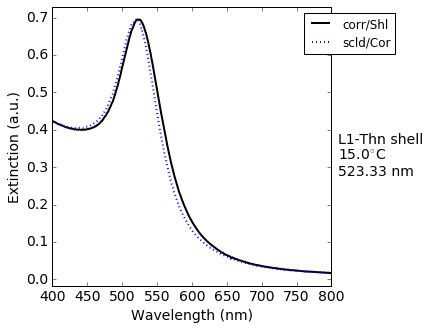

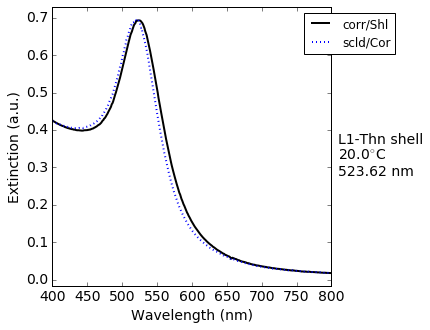

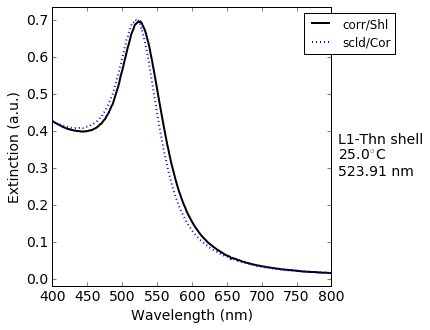

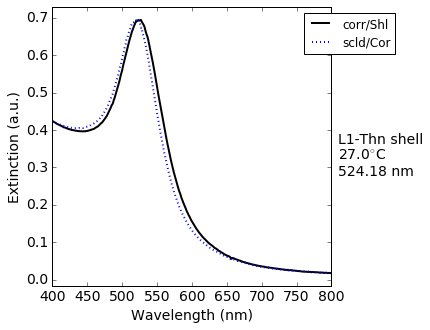

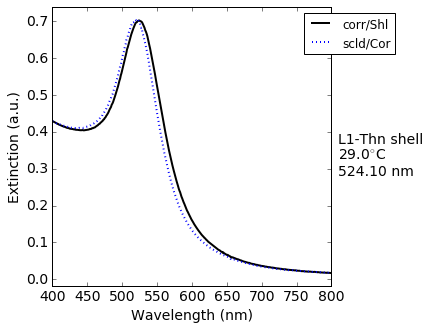

...

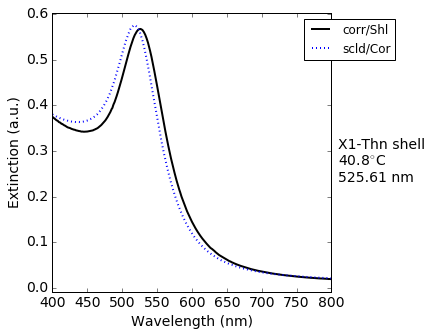

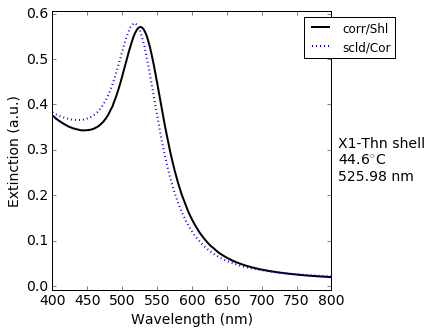

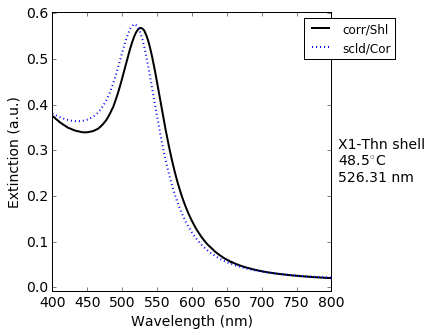

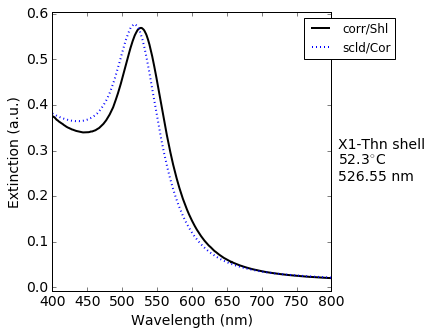

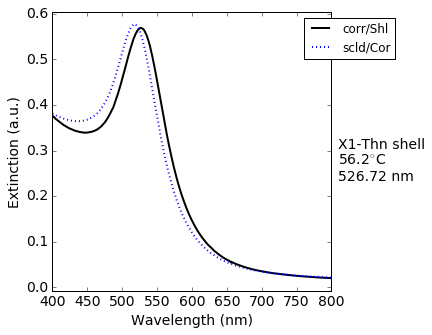

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-7.6.svg


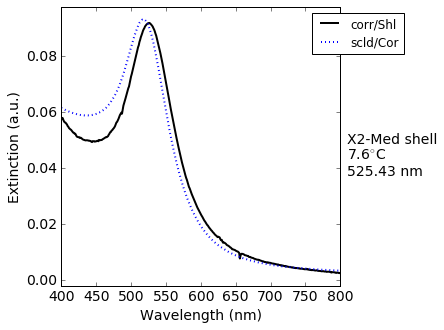

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-10.0.svg


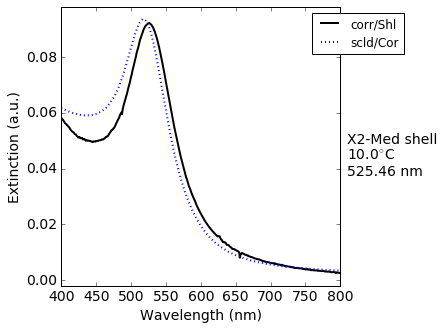

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-13.8.svg


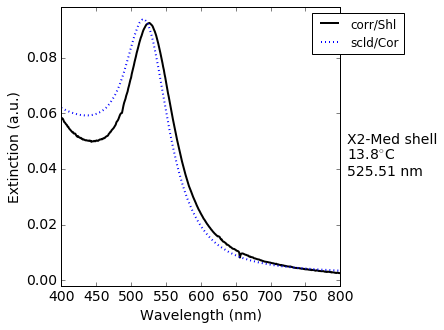

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-17.7.svg


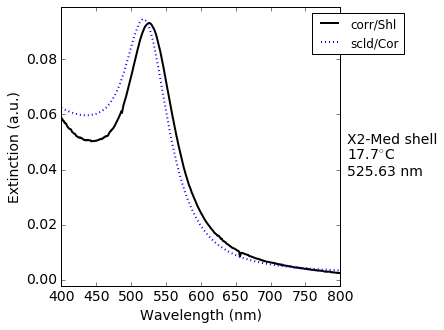

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-21.5.svg


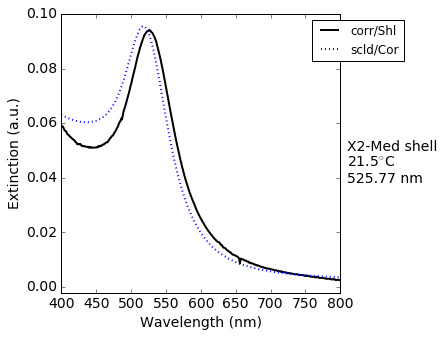

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-25.4.svg


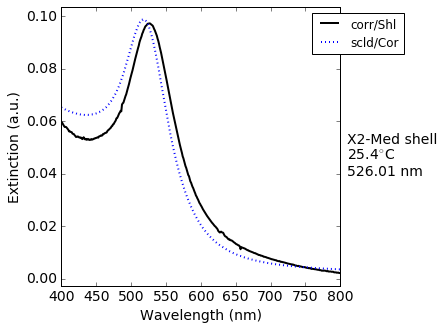

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-27.7.svg


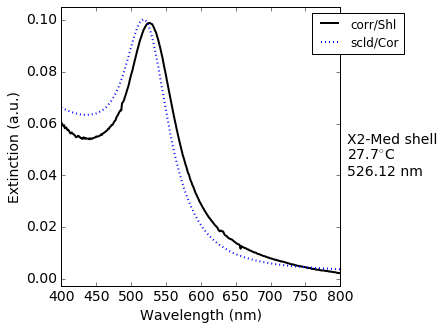

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-28.4.svg


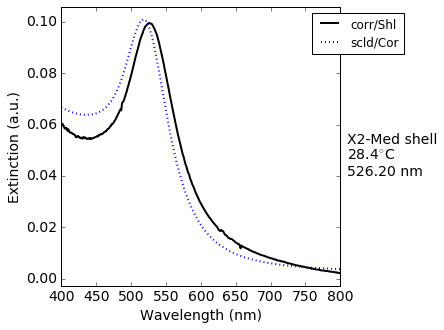

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-29.2.svg


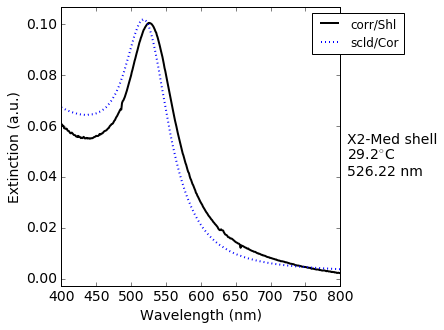

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-30.0.svg


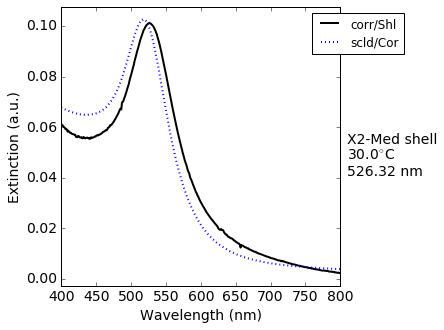

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-30.8.svg


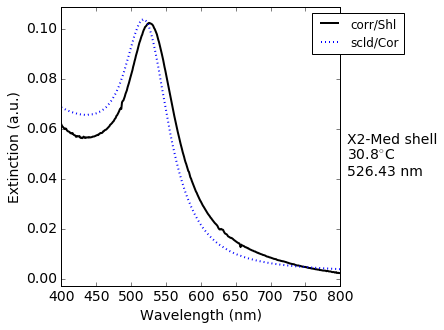

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-31.5.svg


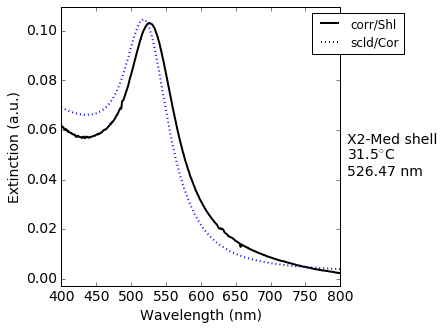

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-32.3.svg


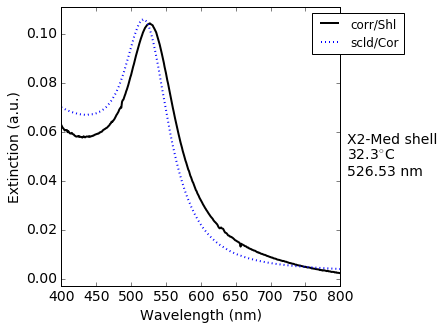

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-33.1.svg


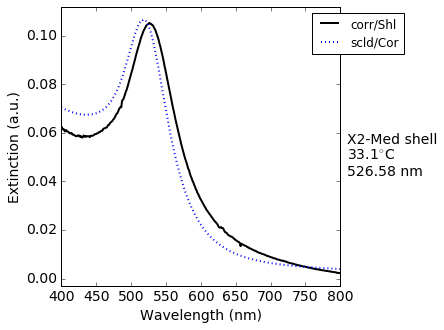

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-33.8.svg


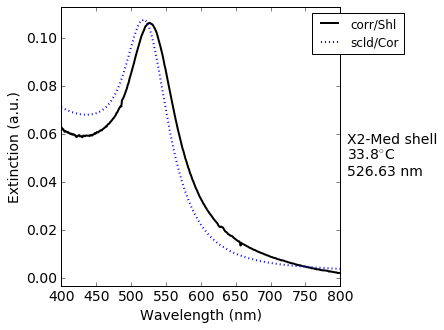

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-36.9.svg


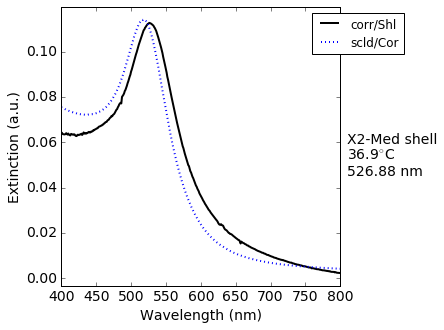

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-40.8.svg


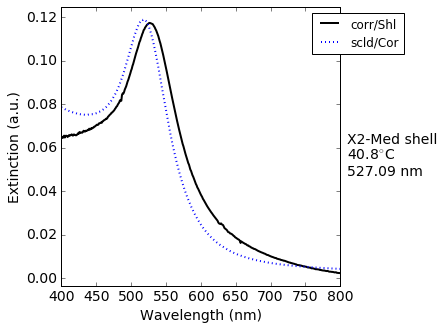

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-44.6.svg


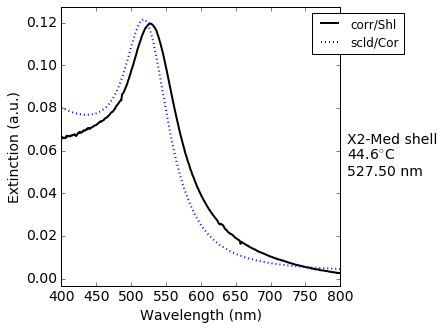

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-48.5.svg


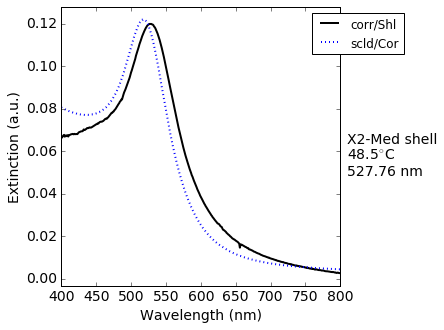

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-52.3.svg


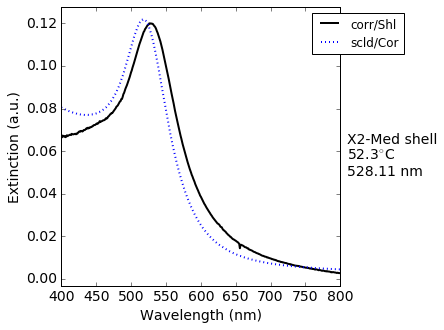

Exported to:
 graphics/20170303_spectrum-baseline-powr-corr_zoom-core-subtr__X2-Med shell-56.2.svg


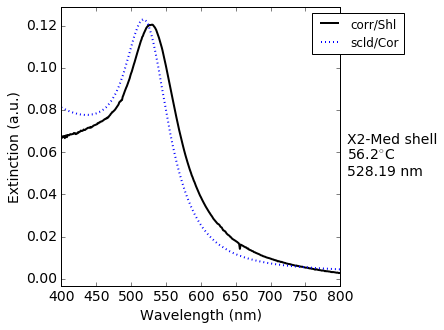

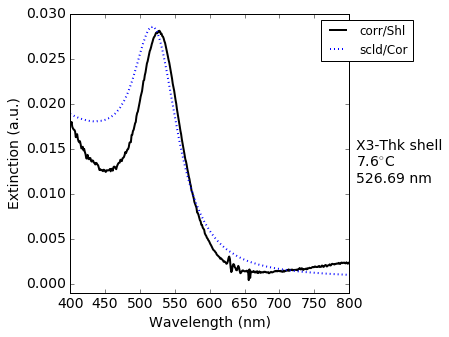

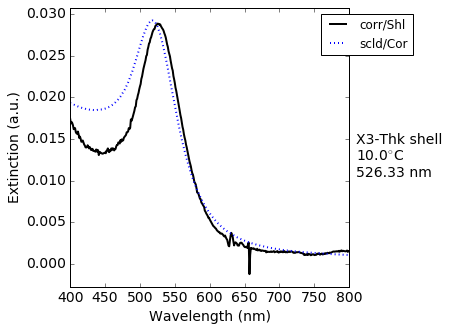

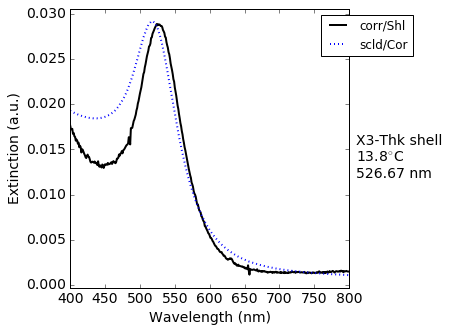

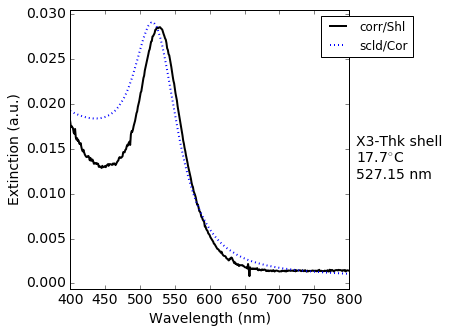

...

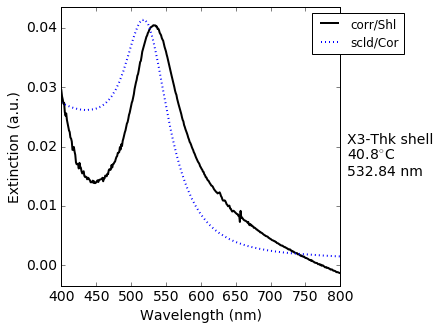

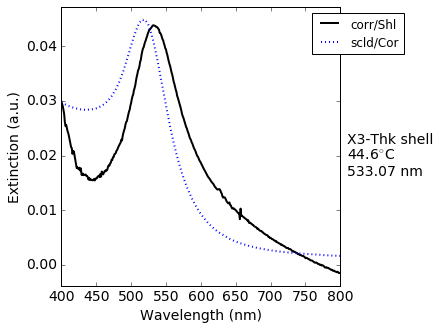

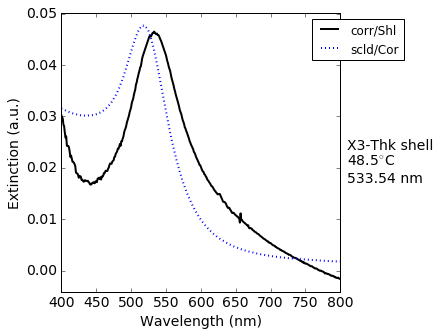

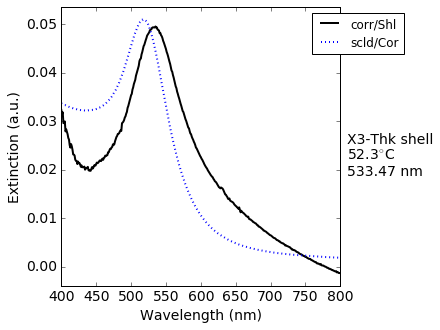

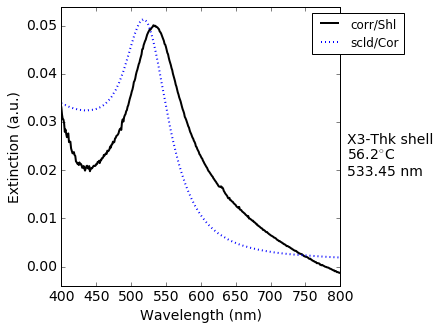

In [21]:
print('Core-shell only spectra: baseline correction')
print('======================================')
print('Individually. ')
print('  * \"corr/Shl\" = corrected core-shell NP spectrum')
print('  * \"scld/Cor\" = core-only NP spectrum scaled to match core-shell ext. peak')

def plotAndSave (sampleNum, tempC):   
    sampleLabel = ['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]+' shell'
    tempLabel = str(round(10*tempC)/10)
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    coreNum = 0
    if (sampleNum >= 3): coreNum = 1
    
    selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum) & (lsprPowrPeakWLnmArray[:,-3] == tempC)
    plotArray = np.asarray(lsprPowrBaselineList)[selection][0]
    scaling = np.asarray(lsprPowrBaselineList)[selection][0,2]
    peakwlnm = lsprPowrPeakWLnmArray[selection][0,0]
    
    # data set 4
    label = 'corr/Shl'
    color = 'black'
    marker = ''
    line = '-'
    x, y = plotArray[0], plotArray[-3]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)

    # data set 5
    label = 'scld/Cor'
    color = 'blue'
    marker = ''
    line = ':'
    plotArray = lsprPowrBaselineCoreList[coreNum]
    x, y = plotArray[0], plotArray[1]*scaling
    if scaling > 0 :
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)

    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.0*dx, np.amax(x)+ 0.0*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Wavelength (nm)')
    pylab.ylabel('Extinction (a.u.)')
    figText = (sampleLabel + '\n' + tempLabel + '$^{\circ}$C' + '\n{0:.2f} nm'.format(peakwlnm))
    pylab.text(xLimits[1]+0.025*dx, yLimits[0]+0.55*dy, figText, 
               verticalalignment='top', horizontalalignment='left')
    pylab.legend(loc='upper right', bbox_to_anchor=(1.25,1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=8)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_spectrum-baseline-powr-corr_zoom-core-subtr_" + '_' + sampleLabel + '-' + tempLabel)
    filename = "graphics/" + timestamp + identifier + exportFormat
    if sampleNum == 4: pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
for sampleNum in range(6):
    for T in spectraTemps[sampleNum]:
        plotAndSave(sampleNum, T)


## Peak wavelength vs temperature plots

### Together with cores

All samples: peak LSPR wavelength vs temperature
Power law baseline corrected for scattering
Together with Au cores in black/gray for reference
Exported to:
 graphics/20170303_lspr-vs-T_powr-corr_all.svg


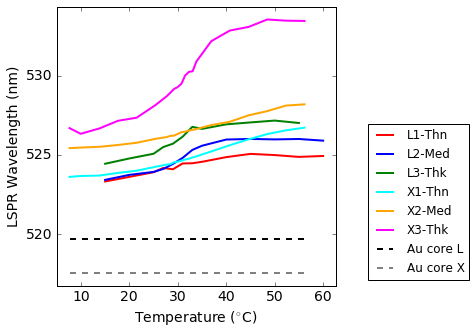

In [22]:
print('All samples: peak LSPR wavelength vs temperature')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together with Au cores in black/gray for reference')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = ['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-3], plotArray[:,0]
        if (x.size > 0) & (max(y) > 0):
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = ''
        line = '--'
        plotArray = lsprPeakWLnmCoreList[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(T); y.append(plotArray[0])
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Temperature ($^{\circ}$C)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='lower right', bbox_to_anchor=(1.5,0), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-T_powr-corr_all" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores

All samples: peak LSPR wavelength vs temperature
Power law baseline corrected for scattering
Together without Au cores
Exported to:
 graphics/20170303_lspr-vs-T_powr-corr_all-no-cores.svg


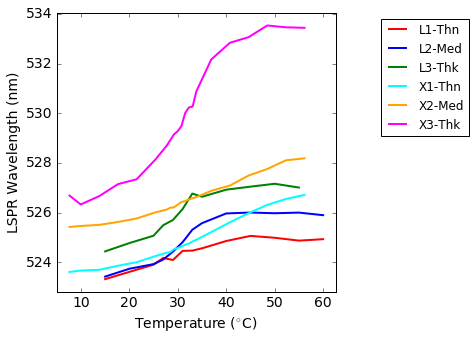

In [23]:
print('All samples: peak LSPR wavelength vs temperature')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together without Au cores')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-3], plotArray[:,0]
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Temperature ($^{\circ}$C)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper right', bbox_to_anchor=(1.5,1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-T_powr-corr_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores, compared to no correction

All samples: peak LSPR wavelength vs temperature
Power law baseline corrected for scattering
Together without Au cores
Exported to:
 graphics/20170303_lspr-vs-T_powr-corr+uncorr_all-no-cores.svg


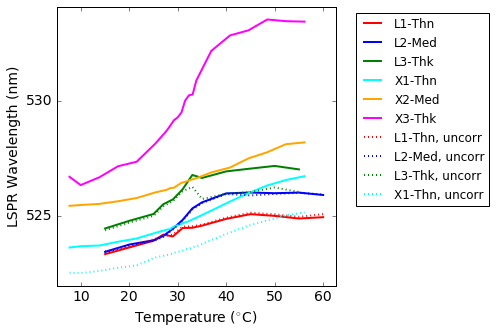

In [24]:
print('All samples: peak LSPR wavelength vs temperature')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together without Au cores')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-3], plotArray[:,0]
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]) + ', uncorr'
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = ':'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-3], plotArray[:,1]
        if max(y) > 0: 
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Temperature ($^{\circ}$C)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05,1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-T_powr-corr+uncorr_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

## Peak wavelength vs hydrodynamic radius $R_h$ plots

### individually with cores

All samples: peak LSPR wavelength vs  hydrodynamic radius
Power law baseline corrected for scattering
Individually with Au core in red for reference
Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_L1-Thn.svg


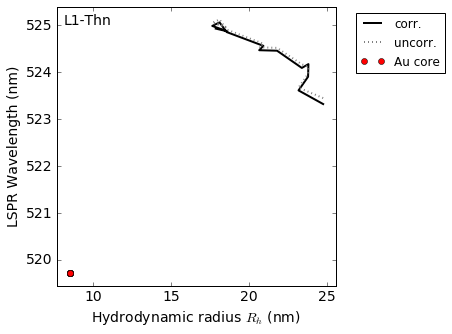

Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_L2-Med.svg


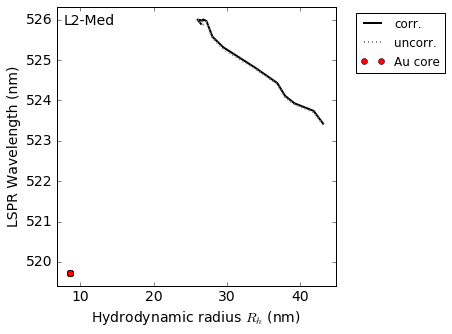

Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_L3-Thk.svg


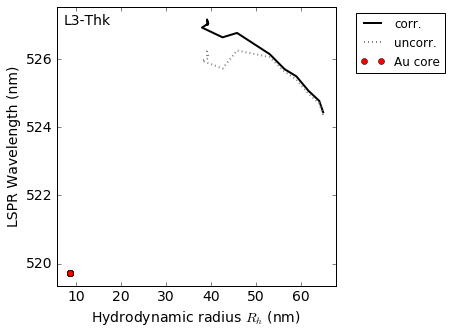

Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_X1-Thn.svg


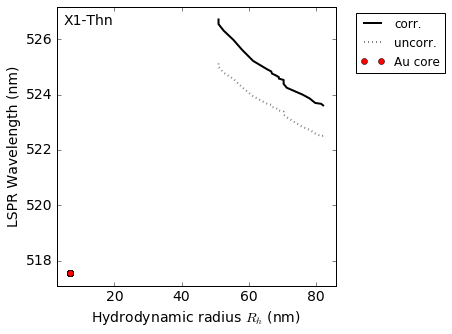

Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_X2-Med.svg


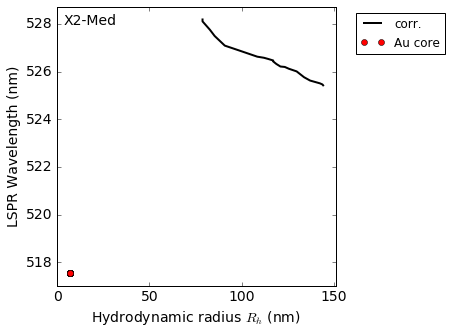

Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_X3-Thk.svg


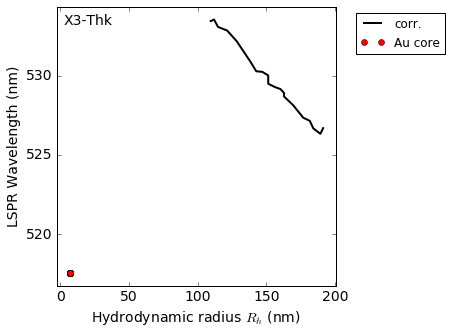

In [25]:
print('All samples: peak LSPR wavelength vs  hydrodynamic radius')
print('================================================')
print('Power law baseline corrected for scattering')
print('Individually with Au core in red for reference')
def plotAndSave (sampleNum):   
    sampleLabel = ['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    
    selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
    plotArray = lsprPowrPeakWLnmArray[selection]

    # data set 1
    label = 'corr.'
    color = 'black'
    marker = ''
    line = '-'
    x, y = plotArray[:,-2], plotArray[:,0]
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 2
    label = 'uncorr.'
    color = 'gray'
    marker = ''
    line = ':'
    x, y = plotArray[:,-2], plotArray[:,1]
    if max(y) > 0:
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    # data set 3
    label = 'Au core'
    color = 'red'
    marker = 'o'
    line = ''
    if sampleNum < 3: 
        plotArray = lsprPeakWLnmCoreList[0]
        Rnm = coreRnms[0]
    else: 
        plotArray = lsprPeakWLnmCoreList[1]
        Rnm = coreRnms[1]
    x, y = [], []
    for T in xs[0]: x.append(Rnm); y.append(plotArray[0])
    xs.append(x), ys.append(y), labels.append(label)
    colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    figText = sampleLabel
    pylab.text(xLimits[0]+0.025*dx, yLimits[1]-0.025*dy, figText, verticalalignment='top', horizontalalignment='left')
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05,1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ( "_lspr-vs-Rh_powr-corr_" + sampleLabel )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
for sampleNum in range(6):
    plotAndSave(sampleNum) 


### Together with cores

All samples: peak LSPR wavelength vs hydrodynamic radius
Power law baseline corrected for scattering
Together with Au cores in black/gray for reference
Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_all.svg


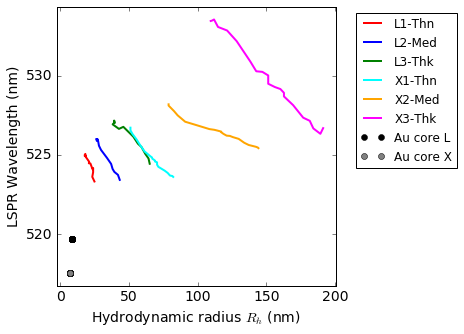

In [26]:
print('All samples: peak LSPR wavelength vs hydrodynamic radius')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together with Au cores in black/gray for reference')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        if (x.size > 0) & (max(y) > 0):
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = 'o'
        line = ''
        plotArray = lsprPeakWLnmCoreList[coreNum]
        Rnm = coreRnms[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(Rnm); y.append(plotArray[0])
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05,1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-Rh_powr-corr_all" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores

All samples: peak LSPR wavelength vs hydrodynamic radius
Power law baseline corrected for scattering
Together without Au cores
Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_all-no-cores.svg


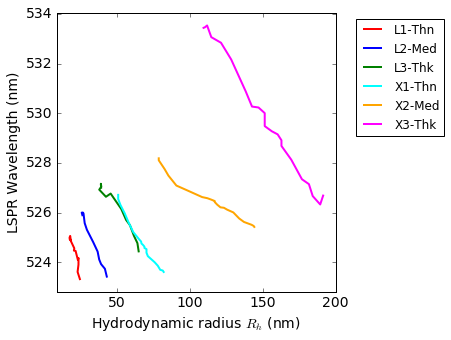

In [27]:
print('All samples: peak LSPR wavelength vs hydrodynamic radius')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together without Au cores')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = ['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-Rh_powr-corr_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores, compared to uncorrected

All samples: peak LSPR wavelength vs hydrodynamic radius
Power law baseline corrected for scattering
Together without Au cores
Exported to:
 graphics/20170303_lspr-vs-Rh_powr-corr_compare_all-no-cores.svg


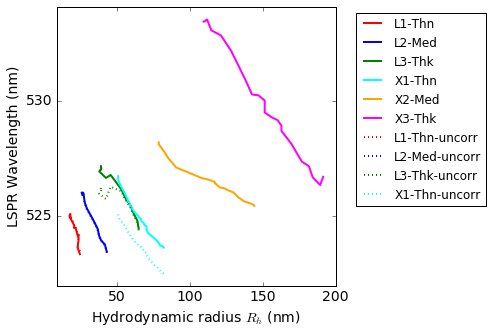

In [28]:
print('All samples: peak LSPR wavelength vs hydrodynamic radius')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together without Au cores')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]) + '-uncorr'
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = ':'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,1]
        if max(y) > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.plot(xs[setNum], ys[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(xs[setNum][i]); y.append(ys[setNum][i])
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)- 0.05*dy, np.amax(y)+ 0.05*dy]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.xlabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.ylabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_lspr-vs-Rh_powr-corr_compare_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

## Hydrodynamic radius vs peak wavelength plots

In [29]:
for sampleNum in range(6):
    rCorenm = coreRnms[0]
    if sampleNum > 2: rCorenm = coreRnms[1]
    selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
    plotArray = lsprPowrPeakWLnmArray[selection]
    x = plotArray[:,-2]
    print(sampleNum, min(np.round(x,1)), max(np.round(x,1)))

0 17.7 24.8
1 26.0 43.2
2 38.0 65.0
3 51.0 82.2
4 78.8 144.2
5 109.5 191.4


### Together with cores

Exported to:
 graphics/20170303_Rh-vs-lspr_powr-corr_all.svg


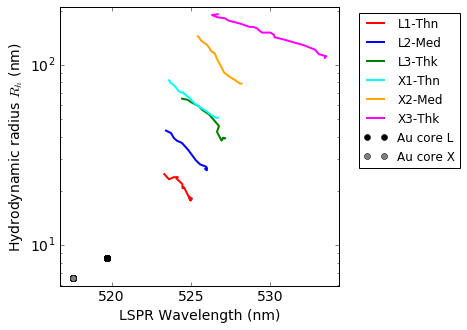

In [30]:
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        if (x.size > 0) & (max(y) > 0):
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    # data set 2
    for coreNum in range(2):
        label = (['Au core L', 'Au core X'][coreNum])
        color = (['black','gray'][coreNum])
        marker = 'o'
        line = ''
        plotArray = lsprPeakWLnmCoreList[coreNum]
        Rnm = coreRnms[coreNum]
        x, y = [], []
        for T in xs[3]: x.append(Rnm); y.append(plotArray[0])
        xs.append(x), ys.append(y), labels.append(label)
        colors.append(color), markers.append(marker), lines.append(line)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.semilogy(ys[setNum], xs[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(ys[setNum][i]); y.append(xs[setNum][i])
    y.append(np.min(spectraRhnms[0]))
    y.append(np.max(spectraRhnms[-1]))
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)*.9, np.amax(y)*1.1]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.ylabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.xlabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05,1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    # pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(axis='x', nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_Rh-vs-lspr_powr-corr_all" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores

Exported to:
 graphics/20170303_Rh-vs-lspr_powr-corr_all-no-cores.svg


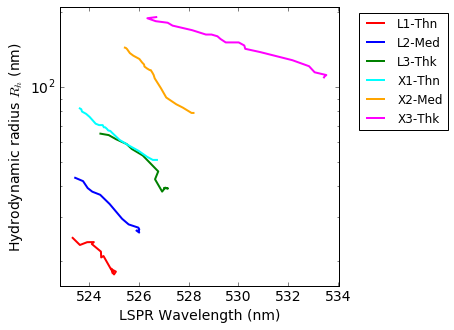

In [31]:
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = ['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.semilogy(ys[setNum], xs[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(ys[setNum][i]); y.append(xs[setNum][i])
    y.append(np.min(spectraRhnms[0]))
    y.append(np.max(spectraRhnms[-1]))
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)*.9, np.amax(y)*1.1]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.ylabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.xlabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    #pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(axis='x', nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_Rh-vs-lspr_powr-corr_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

### Together without cores, compared to uncorrected

All samples: peak LSPR wavelength vs hydrodynamic radius
Power law baseline corrected for scattering
Together without Au cores
Exported to:
 graphics/20170303_Rh-vs-lspr_powr-corr_compare_all-no-cores.svg


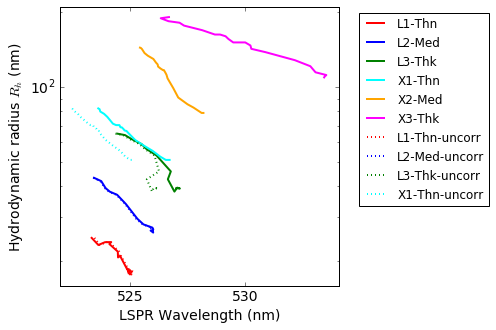

In [32]:
print('All samples: peak LSPR wavelength vs hydrodynamic radius')
print('================================================')
print('Power law baseline corrected for scattering')
print('Together without Au cores')
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    for sampleNum in range(6):
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]) + '-uncorr'
        color = (['red','blue','green','cyan','orange','magenta'][sampleNum])
        marker = '' #(['o','s','v','d','*','>'][sampleNum])
        line = ':'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,1]
        if max(y) > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.semilogy(ys[setNum], xs[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(ys[setNum][i]); y.append(xs[setNum][i])
    y.append(np.min(spectraRhnms[0]))
    y.append(np.max(spectraRhnms[-1]))
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)*0.9, np.amax(y)*1.1]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.ylabel('Hydrodynamic radius $R_h$ (nm)')
    pylab.xlabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)
    
    ## More general format options
    aspectRatio = dx/dy
    figWidthcm = [8.46, 17.78][0] # ACS 1- and 2- column sizes
    figSizein = [figWidthcm/2.54, aspectRatio*figWidthcm/2.54]
    fig = pylab.figure(1, figsize=(figSizein[0],figSizein[1]))
    pylab.subplot(111)
    pylab.rcParams.update({'font.size': 14})
    #pylab.axes().set_aspect(aspectRatio)
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(axis='x', nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_Rh-vs-lspr_powr-corr_compare_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

In [33]:
print('Mean Orig Peak (nm)\t', 'Mean Corr Peak (nm)','\t', 'Orig WL shift (nm)','\t', 'Corr WL shift (nm)','\t', 'Mean diff (orig-corr) (nm)','\t', 'dRh/Rh collapsed (corr)')
for sampleNum in range(6):
    selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
    plotArray = lsprPowrPeakWLnmArray[selection]
    wlavg = np.round(np.mean(plotArray[:,1]), decimals=2)
    wlcorravg = np.round(np.mean(plotArray[:,0]), decimals=2)
    dwl = np.round(np.max(plotArray[:,1]) - np.min(plotArray[:,1]), decimals=2)
    dwlcorr = np.round(np.max(plotArray[:,0]) - np.min(plotArray[:,0]), decimals=2)
    dcorr = np.round(np.mean(plotArray[:,0]-plotArray[:,1]), decimals=2)
    dRh = np.round( (np.max(plotArray[:,-3])-np.min(plotArray[:,-3]))/(np.min(plotArray[:,-3])), decimals=2)
    dRhoverRcore = np.round( (np.max(plotArray[:,-3])-np.min(plotArray[:,-3]))/(coreRnms[0]), decimals=2)
    if sampleNum > 3: dRhoverRcore = np.round( (np.max(plotArray[:,-3])-np.min(plotArray[:,-3]))/(coreRnms[1]), decimals=2)
    print(wlavg,'  \t\t', wlcorravg,'  \t\t', dwl,'  \t\t', dwlcorr,'  \t\t', dcorr,'  \t\t\t', dRh,'  \t\t\t', dRhoverRcore)

Mean Orig Peak (nm)	 Mean Corr Peak (nm) 	 Orig WL shift (nm) 	 Corr WL shift (nm) 	 Mean diff (orig-corr) (nm) 	 dRh/Rh collapsed (corr)
524.47   		 524.41   		 1.68   		 1.74   		 -0.06   			 3.0   			 5.29
524.98   		 525.02   		 2.6   		 2.58   		 0.03   			 3.0   			 5.29
525.61   		 526.1   		 1.89   		 2.72   		 0.49   			 2.67   			 4.71
523.59   		 524.82   		 2.65   		 3.11   		 1.24   			 6.34   			 5.71
0.0   		 526.52   		 0.0   		 2.76   		 526.52   			 6.34   			 7.35
0.0   		 529.89   		 0.0   		 7.21   		 529.89   			 6.34   			 7.35


## Shell-to-core ratio ($R_h/R_{\mathrm{core}}$) vs peak wavelength plots

### Together without cores, compared to uncorrected

Exported to:
 graphics/20170303_Rh-ratio-vs-lspr_powr-corr_compare_all-no-cores.svg


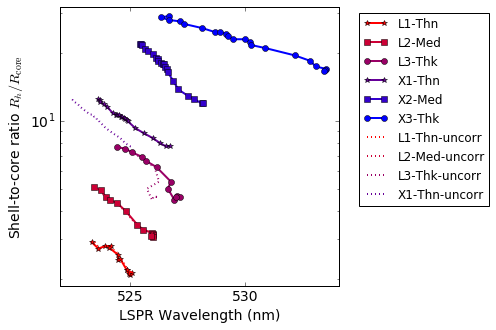

In [34]:
def plotAndSave ():   
    
    # data sets
    sampleLabels = []
    xs, ys, labels, colors, markers, lines = [], [], [], [], [], []
    for sampleNum in range(6):
        rCorenm = coreRnms[0]
        if sampleNum > 2: rCorenm = coreRnms[1]
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum])
        color = (['#ff0000','#cc0035','#990066','#660099','#3300cc','#0000ff'][sampleNum])
        marker = (['*','s','o','*','s','o'][sampleNum])
        line = '-'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,0]
        x = x/rCorenm
        xs.append(x), ys.append(y), labels.append(label), 
        colors.append(color), markers.append(marker), lines.append(line)
        sampleLabels.append(label)
    
    for sampleNum in range(6):
        rCorenm = coreRnms[0]
        if sampleNum > 2: rCorenm = coreRnms[1]
        label = (['L1-Thn','L2-Med','L3-Thk','X1-Thn','X2-Med','X3-Thk'][sampleNum]) + '-uncorr'
        color = (['#ff0000','#cc0035','#990066','#660099','#3300cc','#0000ff'][sampleNum])
        marker = '' 
        line = ':'
        selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
        plotArray = lsprPowrPeakWLnmArray[selection]
        x, y = plotArray[:,-2], plotArray[:,1]
        x = x/rCorenm
        if max(y) > 0:
            xs.append(x), ys.append(y), labels.append(label), 
            colors.append(color), markers.append(marker), lines.append(line)
            sampleLabels.append(label)
    
    ## Plot lines & set limits
    nSets = len(xs)
    for setNum in range(nSets):
        pylab.semilogy(ys[setNum], xs[setNum], label=labels[setNum], 
                   color=colors[setNum], linestyle=lines[setNum], marker=markers[setNum], 
                   linewidth=2)
    x, y = [], []
    for setNum in range(nSets):
        for i in range(len(xs[setNum])): 
            x.append(ys[setNum][i]); y.append(xs[setNum][i])
    y.append(np.min(spectraRhnms[0]/coreRnms[0]))
    y.append(np.max(spectraRhnms[-1]/coreRnms[-1]))
    xLimits = [np.amin(x), np.amax(x)]
    yLimits = [np.amin(y), np.amax(y)]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    xLimits = [np.amin(x)- 0.05*dx, np.amax(x)+ 0.05*dx]
    yLimits = [np.amin(y)*0.9, np.amax(y)*1.1]
    dx, dy = abs(xLimits[1]-xLimits[0]), abs(yLimits[1]-yLimits[0])
    
    ## Specific format options
    pylab.ylabel('Shell-to-core ratio $R_h/R_{\mathrm{core}}$')
    pylab.xlabel("LSPR Wavelength (nm)")
    pylab.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)
    
    ## More general format options
    pylab.xlim(xLimits[0], xLimits[1])
    pylab.ylim(yLimits[0], yLimits[1])
    pylab.locator_params(axis='x', nbins=7)
    
    ## Save and display
    timestamp = ('{:%Y%m%d}'.format(datetime.datetime.now()))
    exportFormat = '.svg'
    identifier = ("_Rh-ratio-vs-lspr_powr-corr_compare_all-no-cores" )
    filename = "graphics/" + timestamp + identifier + exportFormat
    pylab.savefig(filename); print("Exported to:\n", filename)
    pylab.show()
    
plotAndSave()

In [35]:
for sampleNum in range(6):
    rCorenm = coreRnms[0]
    if sampleNum > 2: rCorenm = coreRnms[1]
    selection = (lsprPowrPeakWLnmArray[:,-1] == sampleNum)
    plotArray = lsprPowrPeakWLnmArray[selection]
    x = plotArray[:,-2]
    x = x/rCorenm
    print(sampleNum, min(np.round(x,1)), max(np.round(x,1)))

0 2.1 2.9
1 3.1 5.1
2 4.5 7.6
3 7.7 12.4
4 11.9 21.9
5 16.6 29.0
